## Data Load

In [1]:
import pandas as pd
import os


directory = "Sber-Conditional/Data/"  # set directory path
d = {}
formed = {}

for i, entry in enumerate(os.scandir(directory)):  
    if entry.is_file() and entry.name.endswith('.xlsx'):  # check if it's a file
        # print(entry.name)
        d[entry.name] = pd.read_excel(f"{directory}{entry.name}")
    elif entry.is_file() and entry.name.endswith('.csv'):
        formed[entry.name] = pd.read_csv(f"{directory}{entry.name}")

In [2]:
formed.keys()

dict_keys(['apk.csv', 'apk_nona.csv', 'chemicals.csv', 'chemicals_nona.csv'])

In [10]:
for key, value in d.items():
    print(key)
    print(value.sample(10, random_state=52))
    print("="*100)

global_macro.xlsx
        Date  Инфляция - Рост индекса цен производителей (RUB, eop PPI),    \
118  10,2015                                             -0.011               
112  04,2016                                              0.031               
47   09,2021                                              0.015               
134  06,2014                                              0.004               
120  08,2015                                              0.015               
104  12,2016                                              0.000               
110  06,2016                                              0.000               
50   06,2021                                              0.023               
94   10,2017                                              0.024               
92   12,2017                                              0.009               

     Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),    \
118                 

---
## EDA

### Global macros eda

In [7]:
global_macros = d["global_macro.xlsx"]

In [25]:
global_macros.columns

Index(['Date', 'Инфляция - Рост индекса цен производителей (RUB, eop PPI),  ',
       'Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  ',
       'Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  .1',
       'Инфляция - Рост индекса цен производителей в США, в долларах США (USD, eop PPI),  ',
       'Ключевая ставка,   годовых', 'Инфляция,   г/г'],
      dtype='object')

In [26]:
global_macros["Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  "]

0      0.2
1      0.3
2      0.1
3      0.2
4     -0.1
      ... 
135    0.3
136    0.2
137    0.1
138    0.1
139    0.3
Name: Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  , Length: 140, dtype: float64

In [29]:
global_macros[global_macros["Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  .1"]!=global_macros["Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  "]]

,Date,"Инфляция - Рост индекса цен производителей (RUB, eop PPI),","Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),","Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI), .1","Инфляция - Рост индекса цен производителей в США, в долларах США (USD, eop PPI),","Ключевая ставка, годовых","Инфляция, г/г"


In [46]:
global_macros.drop(columns=["Date"]).drop_duplicates().shape[0]/global_macros.shape[0]

1.0

Колокни "Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  " и "Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  .1" совпадают __полностью__

одну из них можно убрать, чтобы в последствии не возникало проблем с кросскореляцией

In [71]:
global_macros.columns.tolist()

['Date',
 'Инфляция - Рост индекса цен производителей (RUB, eop PPI),  ',
 'Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  ',
 'Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  .1',
 'Инфляция - Рост индекса цен производителей в США, в долларах США (USD, eop PPI),  ',
 'Ключевая ставка,   годовых',
 'Инфляция,   г/г']

In [72]:
global_macros = global_macros.drop(columns=["Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  .1"])

<Axes: >

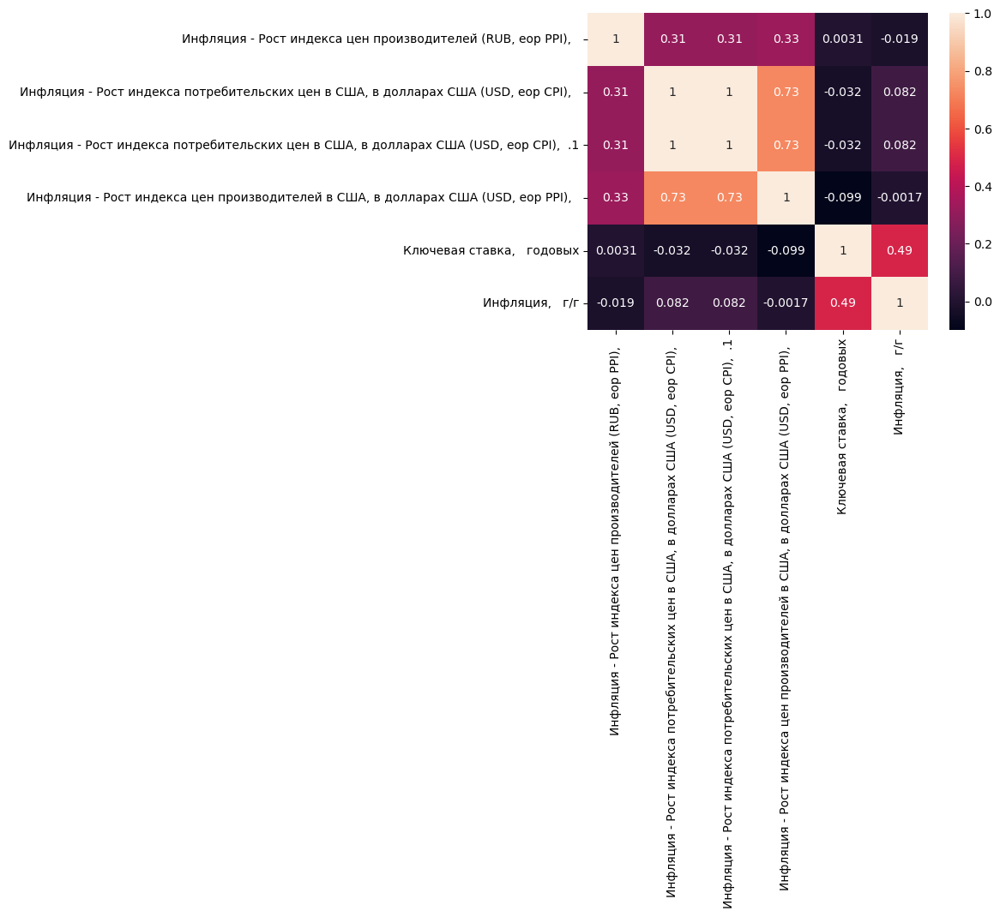

In [31]:
import seaborn as sns

sns.heatmap(d["global_macro.xlsx"].drop(columns=["Date"]).corr(), annot=True)

In [47]:
d.keys()

dict_keys(['global_macro.xlsx', 'Monthly Inputs_АПК_до 05.2025.xlsx', 'Общие макропоказатели май-1.xlsx', 'Цены удобрения и химия_до 06.2025-1.xlsx'])

In [15]:
d["global_macro.xlsx"].sample(10, random_state=52)

,Date,"Инфляция - Рост индекса цен производителей (RUB, eop PPI),","Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),","Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI), .1","Инфляция - Рост индекса цен производителей в США, в долларах США (USD, eop PPI),","Ключевая ставка, годовых","Инфляция, г/г"
118,"10,2015",-0.011,-0.2,-0.2,-0.005,11.00,15.60
112,"04,2016",0.031,0.1,0.1,-0.001,11.00,7.30
47,"09,2021",0.015,0.3,0.3,0.007,6.75,7.40
134,"06,2014",0.004,0.4,0.4,-0.002,7.50,7.81
120,"08,2015",0.015,0.1,0.1,0.002,11.00,15.80
104,"12,2016",0.000,0.2,0.2,0.004,10.00,5.40
110,"06,2016",0.000,0.2,0.2,0.004,10.50,7.50
50,"06,2021",0.023,0.6,0.6,0.008,5.50,6.50
94,"10,2017",0.024,0.5,0.5,0.004,8.25,2.70
92,"12,2017",0.009,0.4,0.4,0.004,7.75,2.50


### АПК

In [16]:
d["Monthly Inputs_АПК_до 05.2025.xlsx"].sample(10, random_state=52)

,USDRUB,33.7787,35.3147,36.1269,35.6723,34.8429,34.3732,34.7491,36.1713,38.0132,...,88.97,91.3,96.11,100.31,102.6,100.87,92.82,86.07,83.3,80.5
38,Пшеница 4-го класса,6.767680,6.813170,7.446250,7.77000,8.510550,8.747020,7.151420,6.472850,6.49187,...,12.983636,13.412045,14.348182,15.522909,15.901364,10.036364,9.886591,9.813273,9.975682,11.485818
3,Кукуруза,5.108300,5.529270,5.558140,6.12138,6.696440,7.186180,7.745680,6.930580,5.95168,...,12.978820,13.445667,13.316270,13.732880,14.084091,9.886110,10.028630,10.225430,10.654530,10.397290
56,Икра красная соленая,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7706.693720,7706.693720,8000.000000,8000.000000,8000.000000,5103.625254,5103.625254,5103.625254,3800.000000,3800.000000
4,Молоко сырое,19.224890,20.104320,20.399630,20.49657,20.064170,19.306530,18.704470,18.415070,18.59092,...,34.629900,35.859431,37.776730,40.040260,40.578982,33.788620,34.298010,34.509900,34.621680,34.347810
17,Соевый шрот,473.751219,499.357904,506.688272,533.40829,542.777934,519.276664,451.021567,447.824865,409.10068,...,494.421000,466.991935,467.740562,450.195304,427.816173,565.499908,525.324746,502.434091,470.987189,495.413028
25,Мясо индейки (в убойном весе),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,256.209838,248.707057,255.000000,260.000000,265.000000,259.034300,255.038475,257.901530,265.243034,265.329359
29,Какао-бобы (USD),2759.000000,2918.000000,2969.000000,2966.00000,2944.000000,3101.000000,3142.000000,3217.000000,3185.00000,...,8955.818182,8697.000000,7273.565217,8128.300000,10714.562500,4456.857143,5889.526316,8090.450000,10459.954545,8610.772727
26,Мясо индейки (в живом весе),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
45,"Рапс, руб./т",10.921240,11.777070,13.147950,12.71399,11.035150,13.828410,11.777210,12.090880,10.14722,...,34.045455,34.988636,39.327273,40.954545,40.181818,31.943182,32.863636,36.113636,38.704545,39.645455
49,"Экспортная цена мороженых крабов, $/т",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,12.469447,16.738520,13.997853,10.549965,21.787180,22.393834,9.646953,13.464300,NaN,NaN


In [20]:
d["Общие макропоказатели май-1.xlsx"]

,Input,2014-03-31 00:00:00,2014-04-30 00:00:00,2014-05-31 00:00:00,2014-06-30 00:00:00,2014-07-31 00:00:00,2014-08-31 00:00:00,2014-09-30 00:00:00,2014-10-31 00:00:00,2014-11-30 00:00:00,...,2024-08-31 00:00:00,2024-09-30 00:00:00,2024-10-31 00:00:00,2024-11-30 00:00:00,2024-12-31 00:00:00,2025-01-31 00:00:00,2025-02-28 00:00:00,2025-03-31 00:00:00,2025-04-30 00:00:00,2025-05-31 00:00:00
0,Инфляция - Рост индекса цен производителей (RU...,0.024984,0.027025,0.036306,0.019118,0.029249,0.024128,0.007872,-0.003040,-0.008025,...,0.009777,0.030280,0.008291,0.008960,0.007956,0.019110,0.018101,0.012239,-0.031118,-0.051776
1,Инфляция - Рост индекса потребительских цен (R...,0.023273,0.026427,0.028465,0.024393,0.020231,0.013557,0.013859,0.017189,0.027742,...,0.019909,0.018287,0.014134,0.026812,0.035396,0.040329,0.033970,0.027121,0.018699,0.013294
2,Инфляция - Рост индекса потребительских цен в ...,0.005577,0.005015,0.005821,0.005097,0.004356,0.002288,0.001037,-0.000286,-0.002009,...,0.002861,0.005229,0.006124,0.007016,0.009026,0.011745,0.010938,0.006003,0.003000,0.001999
3,Курс рубля к доллару США в конце года (eop USD...,35.551498,35.620399,34.617699,33.727200,35.560001,36.944199,39.325199,41.013000,49.257999,...,91.496429,94.228729,97.019058,107.740000,101.680000,98.010000,87.700000,83.680000,81.560000,80.000000
4,Ключевая ставка на конец года (eop),0.070000,0.075000,0.075000,0.075000,0.080000,0.080000,0.080000,0.080000,0.095000,...,0.180000,0.190000,0.210000,0.210000,0.210000,0.210000,0.210000,0.210000,0.210000,0.210000
5,Инфляция з.платы (Рост номинальных заработных ...,-0.097303,-0.058156,-0.017605,0.096028,0.051491,0.003092,-0.037779,-0.034321,-0.000924,...,-0.006276,-0.033163,-0.030132,0.003609,0.199068,0.201129,0.202840,-0.073597,-0.053754,-0.027338
6,Инфляция - Рост индекса цен производителей в С...,0.005002,0.006003,0.010019,0.009008,0.008004,0.002994,0.005004,-0.000001,0.000998,...,0.000996,0.005008,0.003002,0.006008,0.008020,0.010032,0.006008,-0.001600,-0.898000,-0.798898
7,Ключевая ставка средняя за период (av),0.062500,0.065000,0.075000,0.072500,0.077500,0.077500,0.077500,0.080000,0.087500,...,0.170000,0.180000,0.180000,0.195000,0.200000,0.210000,0.210000,0.210000,0.210000,0.210000
8,Средний за период курс рубля к доллару США (av...,34.963333,35.696667,35.600000,35.000000,34.660000,35.053333,36.206667,38.246667,41.496667,...,88.137767,89.221600,92.126667,95.909000,99.624333,101.209567,98.712000,93.263333,87.406667,83.300000
9,Средний за период курс рубля к EUR (av EUR/RUB),47.946667,49.106667,49.096667,48.023333,47.260000,47.293333,48.000000,49.590000,52.636667,...,95.849467,98.005233,101.366667,104.426667,106.586667,106.484677,103.190019,98.148389,94.477045,92.527604


In [ ]:
d["Общие макропоказатели май-1.xlsx"].columns.tolist()

In [35]:
formed.keys()

dict_keys(['apk.csv', 'apk_nona.csv', 'chemicals.csv', 'chemicals_nona.csv'])

In [4]:
apk_1 = formed["apk.csv"]
apk_nona = formed["apk_nona.csv"]
chemicals = formed["chemicals.csv"]
chemicals_nona = formed["chemicals_nona.csv"]

In [37]:
apk_1

,Unnamed: 0,USDRUB,Кукуруза,Молоко сырое,Мясо птицы бройлеров в убойном весе,Мясо птицы бройлеров в живом весе,Мясо крупного рогатого скота в убойном весе,Мясо крупного рогатого скота в живом весе,Подсолнечник,Пшеница 1-го класса,...,"Мука пшеничная, руб./т","Пшеница 12,5% FOB Ново, $/т","Экспортная цена мороженых крабов, $/т","Экспортная цена живых крабов, $/т","Треска, Мурманск","Горбуша, Владивосток","Треска, CFR EU $/т","Кета ПБГ, Владивосток","Нерка ПБГ, Владивосток",Икра красная соленая
0,2014-01-01,33.7787,5.10830,19.22489,NaN,53.78150,NaN,71.50234,9.354690,6.280540,...,11.66556,281.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-02-01,35.3147,5.52927,20.10432,NaN,53.73414,NaN,70.26937,8.948730,6.703800,...,11.59769,278.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-03-01,36.1269,5.55814,20.39963,NaN,54.36590,NaN,70.87358,10.374500,7.572830,...,11.78734,290.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-04-01,35.6723,6.12138,20.49657,NaN,55.41361,NaN,71.26701,10.977020,8.143270,...,12.26536,291.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-05-01,34.8429,6.69644,20.06417,NaN,58.83824,NaN,73.39434,11.599550,10.168250,...,12.84780,269.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,2025-01-01,100.8700,9.88611,33.78862,146.640909,122.24555,311.581818,151.65117,26.193182,10.036364,...,21.35402,240.00,22.393834,31.828838,260.909091,137.500000,3540.0,315.909091,481.818182,5103.625254
133,2025-02-01,92.8200,10.02863,34.29801,149.068182,117.15675,319.700000,148.81030,26.215909,9.886591,...,21.57677,222.25,9.646953,22.834505,253.636364,151.136364,3890.0,310.227273,481.818182,5103.625254
134,2025-03-01,86.0700,10.22543,34.50990,150.900000,113.32584,328.014545,160.52646,26.125000,9.813273,...,21.60039,204.00,13.464300,24.352595,250.681818,153.409091,4170.0,290.909091,480.681818,5103.625254
135,2025-04-01,83.3000,10.65453,34.62168,149.218182,114.79350,334.190909,165.43448,27.125000,9.975682,...,21.12105,210.75,NaN,NaN,254.545455,150.000000,3470.0,281.818182,478.409091,3800.000000


In [ ]:
miss_cols = set(d["Monthly Inputs_АПК_до 05.2025.xlsx"]["USDRUB"].values.tolist()) - set(apk_nona.columns.tolist())
apk_nona.drop(columns=["Unnamed: 0"]).corr()

In [59]:
miss_cols

{'Год',
 'Горбуша, Владивосток',
 'Икра красная соленая',
 'Квартал',
 'Кета ПБГ, Владивосток',
 'Месяц',
 'Мясо индейки (в живом весе)',
 'Мясо индейки (в убойном весе)',
 'Мясо крупного рогатого скота в убойном весе ',
 'Мясо птицы бройлеров в убойном весе ',
 'Нерка ПБГ, Владивосток',
 'Свекла',
 'Свинина в убойном весе, полутуши ',
 'Треска, CFR EU $/т',
 'Треска, Мурманск',
 'Экспортная цена живых крабов, $/т',
 'Экспортная цена мороженых крабов, $/т'}

17 временных рядов перечисленные выше содержат пропуски в значениях временного ряда, что для базового случая является недопустимым, на первое время убираем их из выборки

In [65]:
prods[prods["USDRUB"]=="Горбуша, Владивосток"].isna().sum(axis=1).values[0]

38

In [63]:
prods[prods["USDRUB"]=="Горбуша, Владивосток"]

,USDRUB,33.7787,35.3147,36.1269,35.6723,34.8429,34.3732,34.7491,36.1713,38.0132,...,88.97,91.3,96.11,100.31,102.6,100.87,92.82,86.07,83.3,80.5
52,"Горбуша, Владивосток",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,238.636364,258.181818,277.272727,296.590909,309.090909,137.5,151.136364,153.409091,150.0,145.454545


In [67]:
prods = d["Monthly Inputs_АПК_до 05.2025.xlsx"]
for cat in list(miss_cols):
    print(f"For cat: {cat} there are {(prods[prods["USDRUB"]==cat].isna().sum(axis=1).values[0]/prods.shape[1])*100:.2f}% of nans")

For cat: Мясо индейки (в живом весе) there are 99.28% of nans
For cat: Треска, Мурманск there are 3.62% of nans
For cat: Экспортная цена живых крабов, $/т there are 18.84% of nans
For cat: Кета ПБГ, Владивосток there are 27.54% of nans
For cat: Нерка ПБГ, Владивосток there are 27.54% of nans
For cat: Треска, CFR EU $/т there are 26.09% of nans
For cat: Свинина в убойном весе, полутуши  there are 8.70% of nans
For cat: Мясо птицы бройлеров в убойном весе  there are 8.70% of nans
For cat: Мясо крупного рогатого скота в убойном весе  there are 8.70% of nans
For cat: Свекла there are 44.93% of nans
For cat: Экспортная цена мороженых крабов, $/т there are 18.84% of nans
For cat: Месяц there are 0.00% of nans
For cat: Икра красная соленая there are 56.52% of nans
For cat: Квартал there are 0.00% of nans
For cat: Год there are 0.00% of nans
For cat: Мясо индейки (в убойном весе) there are 8.70% of nans
For cat: Горбуша, Владивосток there are 27.54% of nans


<Axes: >

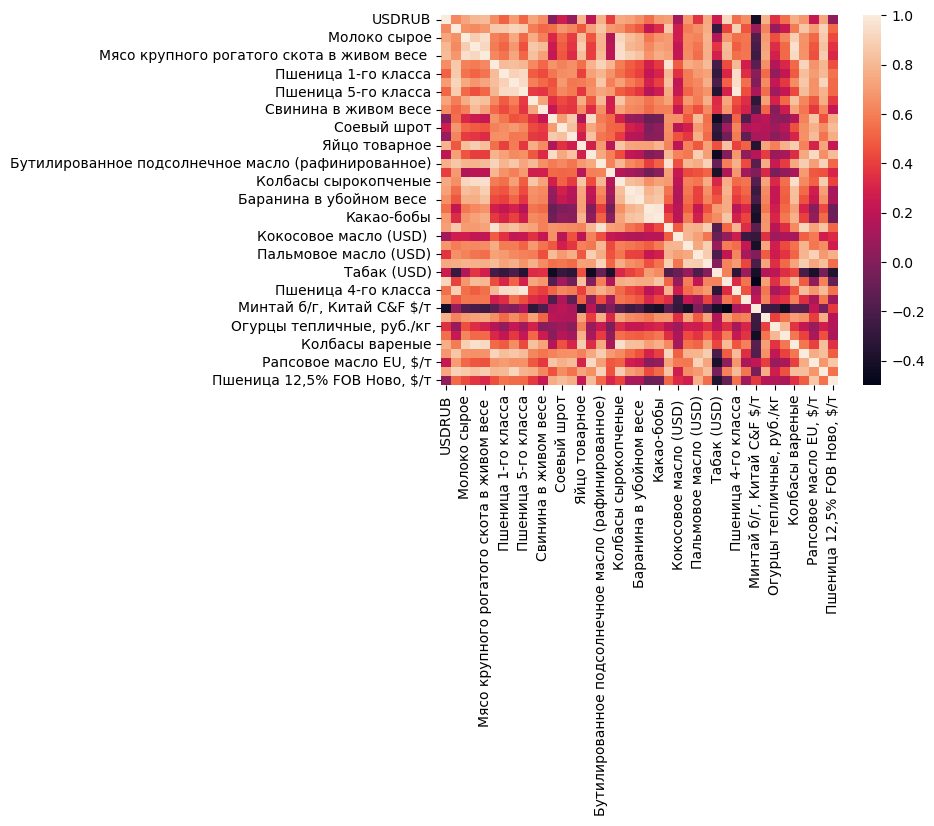

In [40]:
sns.heatmap(apk_nona.drop(columns=["Unnamed: 0"]).corr())

---
### Химия

In [21]:
d["Цены удобрения и химия_до 06.2025-1.xlsx"]

,Unnamed: 0,Unnamed: 1,2016-01-01 00:00:00,2016-02-01 00:00:00,2016-03-01 00:00:00,2016-04-01 00:00:00,2016-05-01 00:00:00,2016-06-01 00:00:00,2016-07-01 00:00:00,2016-08-01 00:00:00,...,2024-09-01 00:00:00,2024-10-01 00:00:00,2024-11-01 00:00:00,2024-12-01 00:00:00,2025-01-01 00:00:00,2025-02-01 00:00:00,2025-03-01 00:00:00,2025-04-01 00:00:00,2025-05-01 00:00:00,2025-06-01 00:00:00
0,Карбамид (FOB Южный),$/т,209.875000,207.125,199.875,203.875,200.500,191.250,176.250,183.750,...,311.250000,333.125000,317.500000,317.833333,347.800000,387.000000,361.000000,351.000000,379.996975,324.577372
1,"Моноаммонийфосфат, MAP (FOB Балтика)",$/т,366.250000,332.500,345.000,346.250,341.500,340.000,338.750,340.000,...,603.250000,590.625000,585.000000,571.666667,575.000000,585.250000,604.000000,636.250000,662.500000,541.566601
2,Апатитовый концетрат (FOB Morocco),$/т,120.000000,117.500,117.500,115.000,107.500,107.500,107.500,107.500,...,157.500000,153.750000,153.125000,155.000000,155.000000,155.000000,152.500000,152.500000,152.500000,128.381623
3,Аммиак (FOB Черное море),$/т,266.666667,260.500,267.500,271.000,279.250,271.125,258.500,203.750,...,493.683910,523.683910,526.183910,533.683910,513.817188,489.909926,455.534926,397.826593,367.009926,412.434449
4,Аммиачная селитра (FOB Черное море),$/т,199.375000,182.125,180.300,172.000,154.750,143.100,138.625,144.375,...,259.375000,261.750000,240.875000,247.500000,255.800000,274.250000,268.750000,256.250000,262.500000,286.748100
5,Хлорид калия (CFR Ю-В Азия),$/т,278.750000,272.500,267.500,267.500,251.875,244.375,242.500,242.500,...,302.500000,305.000000,305.000000,305.833333,300.000000,308.750000,314.500000,334.000000,345.000000,328.857020
6,NPK,$/т,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,390.125000,380.900000,378.000000,393.750000,394.600000,386.625000,393.750000,373.750000,378.200000,376.125225
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Капролактам импортный контракт (Тайвань и Ю. К...,$/т,1153.000000,1163.000,1290.000,1355.000,1278.000,1293.000,1340.000,1400.000,...,1620.000000,1520.000000,1490.000000,1493.000000,1440.000000,1460.000000,1593.335502,1593.335502,1593.335502,1593.335502


In [42]:
chemicals_nona

,Date,Карбамид (FOB Южный),"Моноаммонийфосфат, MAP (FOB Балтика)",Апатитовый концетрат (FOB Morocco),Аммиак (FOB Черное море),Аммиачная селитра (FOB Черное море),Хлорид калия (CFR Ю-В Азия),Капролактам импортный контракт (Тайвань и Ю. Корея) CFR Азия,Метанол,"Бензол, CFR Япония","Этилен, CFR Китай"
0,2016-01-01,209.875000,366.250000,120.000000,266.666667,199.3750,278.75000,1153.000000,185.400000,556.000000,987.500000
1,2016-02-01,207.125000,332.500000,117.500000,260.500000,182.1250,272.50000,1163.000000,150.000000,546.250000,927.500000
2,2016-03-01,199.875000,345.000000,117.500000,267.500000,180.3000,267.50000,1290.000000,164.750000,625.000000,1173.750000
3,2016-04-01,203.875000,346.250000,115.000000,271.000000,172.0000,267.50000,1355.000000,179.900000,642.000000,1192.500000
4,2016-05-01,200.500000,341.500000,107.500000,279.250000,154.7500,251.87500,1278.000000,201.250000,631.250000,1160.000000
...,...,...,...,...,...,...,...,...,...,...,...
109,2025-02-01,387.000000,585.250000,155.000000,489.909926,274.2500,308.75000,1460.000000,359.250000,910.000000,893.333333
110,2025-03-01,361.000000,604.000000,152.500000,455.534926,268.7500,314.50000,1593.335502,375.500000,850.000000,856.250000
111,2025-04-01,351.000000,636.250000,152.500000,397.826593,256.2500,334.00000,1593.335502,322.250000,768.750000,808.750000
112,2025-05-01,379.996975,662.500000,152.500000,367.009926,262.5000,345.00000,1593.335502,278.250000,716.666667,782.500000


---
## SkForecast
В этой секции идет построение пайплайна с использованием skforecast с целью построения предсказаний используя RandomForest, для анализа важности признаков

### Data preprocessing

In [2]:
global_macros = d["global_macro.xlsx"]
apk_nona = formed["apk_nona.csv"]

In [3]:
global_macros = global_macros.drop(columns=["Инфляция - Рост индекса потребительских цен в США, в долларах США (USD, eop CPI),  .1"])

In [4]:
apk_nona["Date"] = apk_nona["Unnamed: 0"]
apk_nona["Date"] = pd.to_datetime(apk_nona["Date"])

In [5]:
global_macros = global_macros.iloc[3:][::-1].reset_index(drop=True)
global_macros = global_macros.drop(columns=["Date"])
global_macros.index = apk_nona["Date"]

apk_nona = apk_nona.set_index('Date')

In [6]:
global_macros["Date"] = pd.to_datetime(global_macros["Date"], format="%m,%Y")

In [7]:
global_macros = global_macros.iloc[3:][::-1].reset_index(drop=True)
global_macros = global_macros.set_index('Date')

In [8]:
assert global_macros.shape[0] == apk_nona.shape[0]

In [12]:
from utils.data_prepocessing import _ensure_monthly_index_and_align_exog, plot_forecaster_feature_importance

apk_nona_en, global_macros_en = _ensure_monthly_index_and_align_exog(apk_nona, global_macros)

### Training and evaluation pipelines

Кукуруза
Already exists skip results\lgb_Кукуруза_Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Молоко сырое_Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Мясо птицы бройлеров в живом весе _Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Мясо крупного рогатого скота в живом весе _Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Подсолнечник_Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Пшеница 1-го класса_Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Пшеница 3-го класса_Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Пшеница 5-го класса_Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Сахар (средняя цена по России)_Кукуруза_tables\feature_imp_df_results.csv
Already exists skip results\lgb_Свинина в живом весе_Кукуруза_tables\feature_imp_df_results.csv
Already exists s

C:\Users\omirz\Desktop\Sber_conditional\utils\utils.py:179: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_w, fig_h), squeeze=False)


Saved figure: results/lgb_Подсолнечный шрот _Пшеница 12,5% FOB Ново, $ т_featureimportance_new\feature_mode_top_Подсолнечный шрот _Пшеница 12,5% FOB Ново, $ т_lgb.png
Starting predicting Колбасы сырокопченые by Пшеница 12,5% FOB Ново, $ т
[INFO] model=lgb, lags=6, horizon=12, fold=1/3, cutoff=2022-05-01
[INFO] model=lgb, lags=6, horizon=12, fold=2/3, cutoff=2023-05-01
[INFO] model=lgb, lags=6, horizon=12, fold=3/3, cutoff=2024-05-01
[INFO] model=lgb, lags=12, horizon=12, fold=1/3, cutoff=2022-05-01
[INFO] model=lgb, lags=12, horizon=12, fold=2/3, cutoff=2023-05-01
[INFO] model=lgb, lags=12, horizon=12, fold=3/3, cutoff=2024-05-01
[INFO] model=lgb, lags=24, horizon=12, fold=1/3, cutoff=2022-05-01
[INFO] model=lgb, lags=24, horizon=12, fold=2/3, cutoff=2023-05-01
[INFO] model=lgb, lags=24, horizon=12, fold=3/3, cutoff=2024-05-01
[INFO] model=lgb, lags=6, horizon=24, fold=1/3, cutoff=2019-05-01
[INFO] model=lgb, lags=6, horizon=24, fold=2/3, cutoff=2021-05-01
[INFO] model=lgb, lags=6, hor

C:\Users\omirz\AppData\Local\Temp\ipykernel_14824\66868207.py:752: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)


Saved!
Saved!
Saved!
Saved!
Saved figure: results/lgb_Колбасы сырокопченые_Пшеница 12,5% FOB Ново, $ т_featureimportance_new\feature_mode_top_Колбасы сырокопченые_Пшеница 12,5% FOB Ново, $ т_lgb.png
Starting predicting Баранина в живом весе by Пшеница 12,5% FOB Ново, $ т
[INFO] model=lgb, lags=6, horizon=12, fold=1/3, cutoff=2022-05-01
[INFO] model=lgb, lags=6, horizon=12, fold=2/3, cutoff=2023-05-01
[INFO] model=lgb, lags=6, horizon=12, fold=3/3, cutoff=2024-05-01
[INFO] model=lgb, lags=12, horizon=12, fold=1/3, cutoff=2022-05-01
[INFO] model=lgb, lags=12, horizon=12, fold=2/3, cutoff=2023-05-01
[INFO] model=lgb, lags=12, horizon=12, fold=3/3, cutoff=2024-05-01
[INFO] model=lgb, lags=24, horizon=12, fold=1/3, cutoff=2022-05-01
[INFO] model=lgb, lags=24, horizon=12, fold=2/3, cutoff=2023-05-01
[INFO] model=lgb, lags=24, horizon=12, fold=3/3, cutoff=2024-05-01
[INFO] model=lgb, lags=6, horizon=24, fold=1/3, cutoff=2019-05-01
[INFO] model=lgb, lags=6, horizon=24, fold=2/3, cutoff=2021-05

ValueError: 
Actual vs predicted Минтай б г, Китай C&F $ т (model=lgb, lags=6, predict_base=Пшеница 12,5% FOB Ново, $ т)
                                          ^
ParseException: Expected end of text, found '$'  (at char 42), (line:1, col:43)

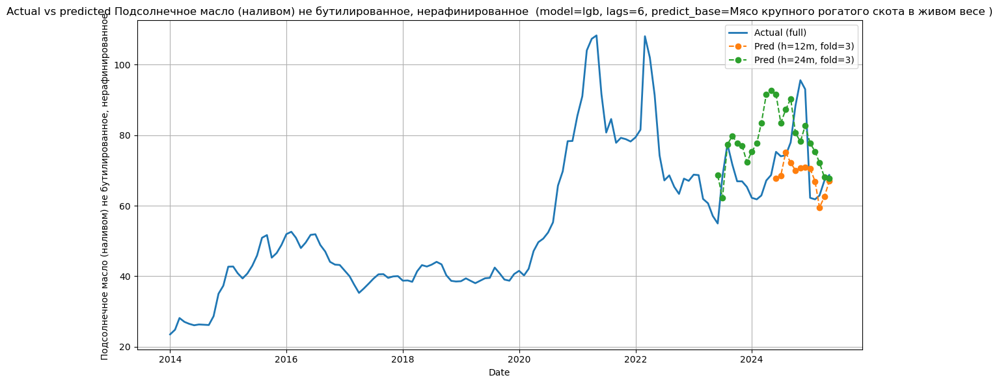

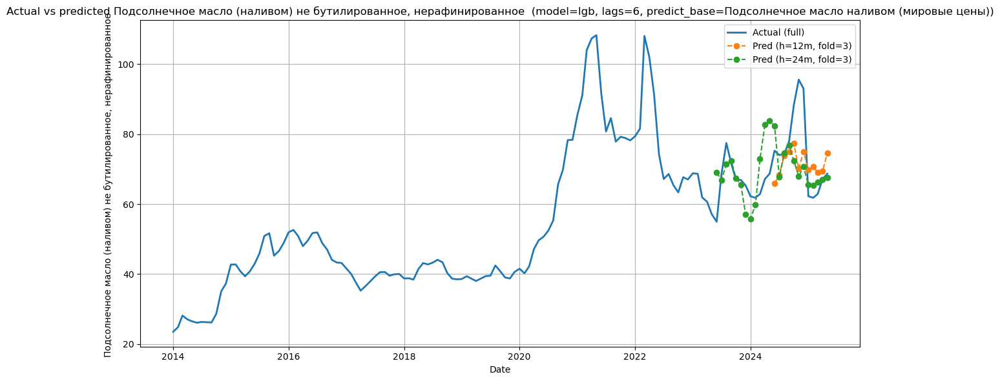

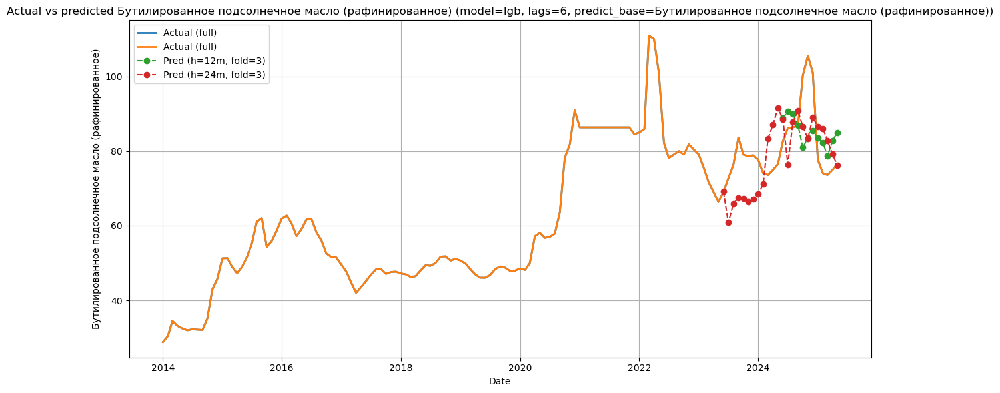

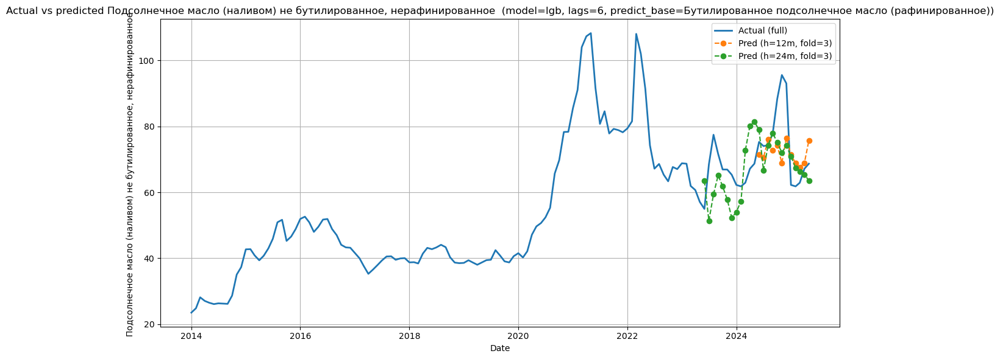

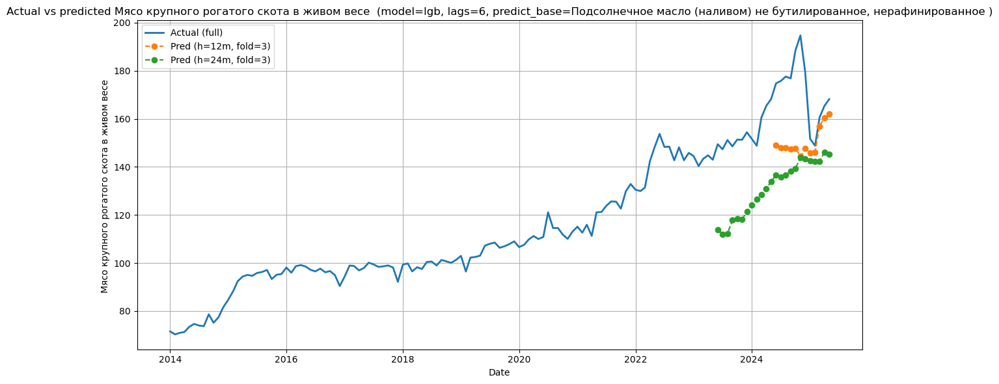

...

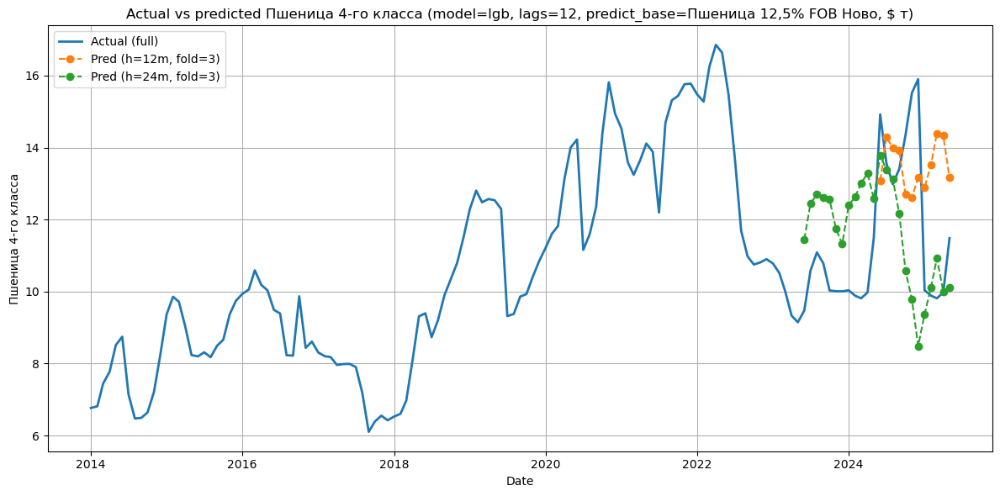

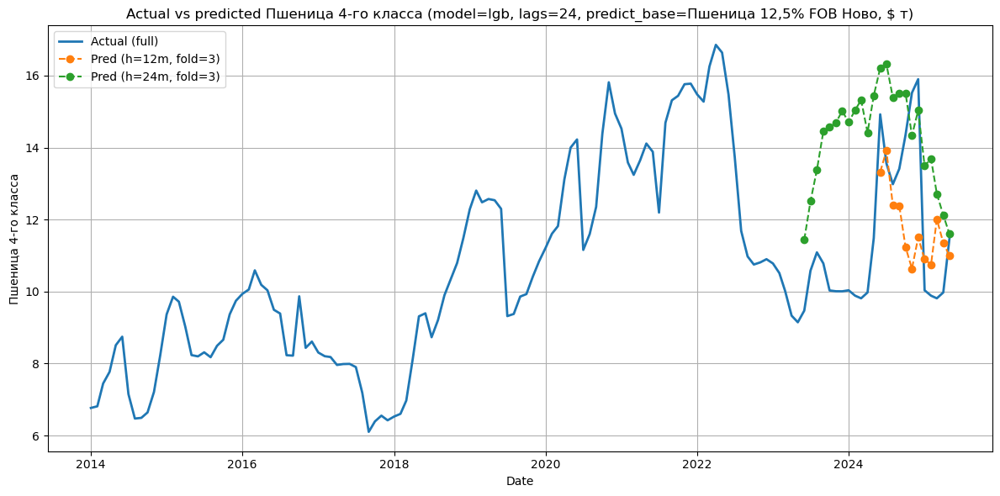

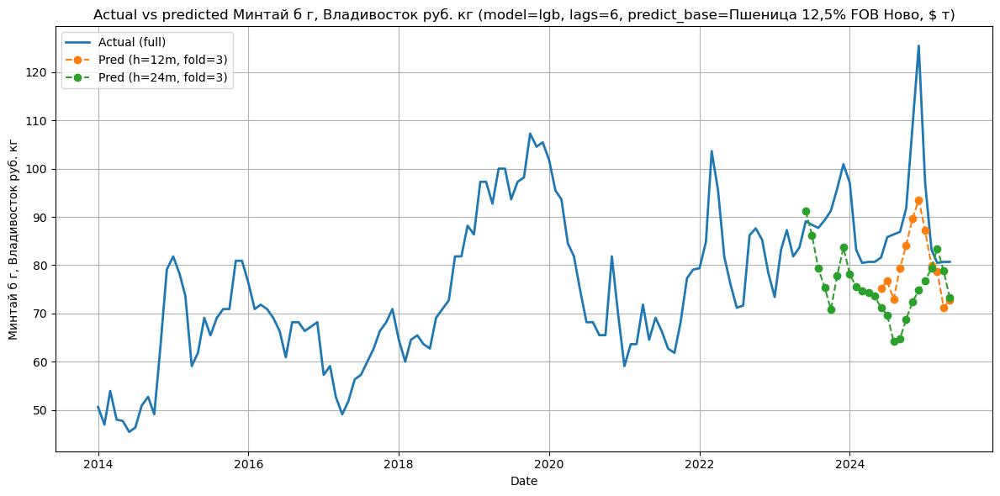

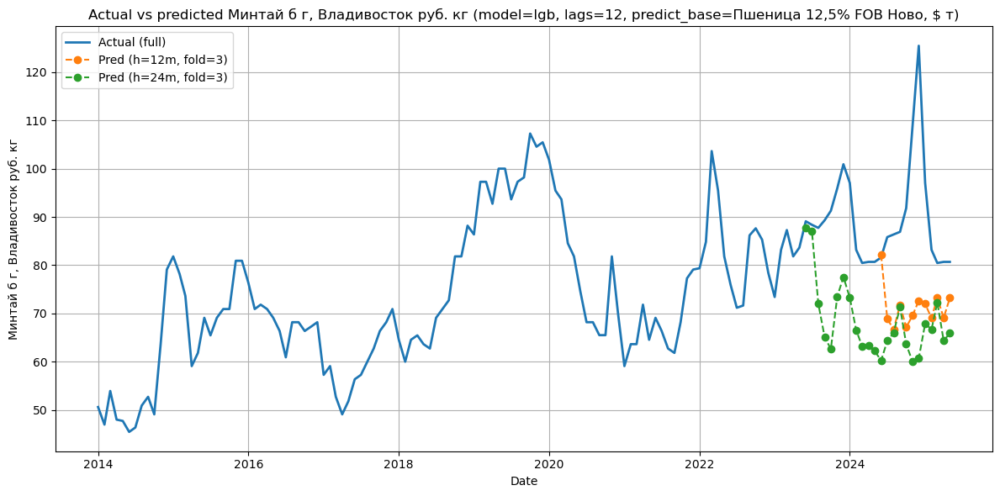

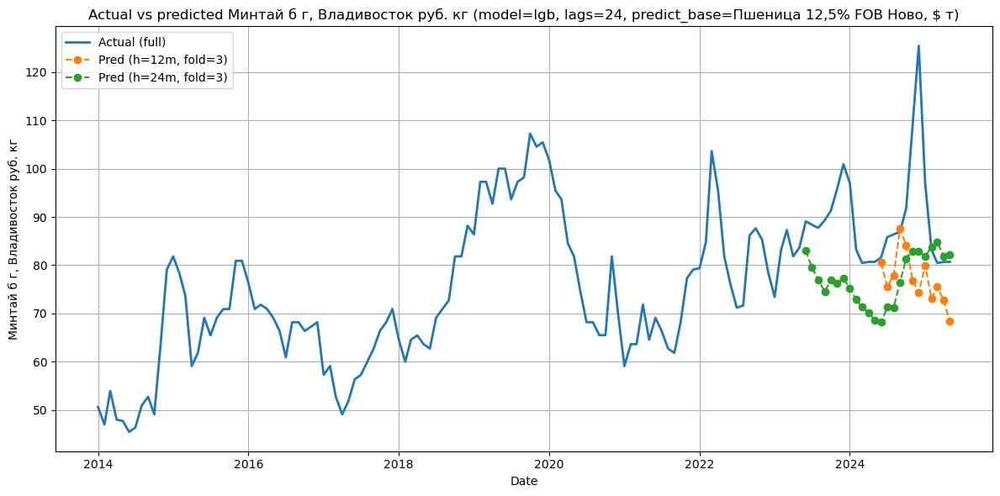

ValueError: 
Actual vs predicted Минтай б г, Китай C&F $ т (model=lgb, lags=6, predict_base=Пшеница 12,5% FOB Ново, $ т)
                                          ^
ParseException: Expected end of text, found '$'  (at char 42), (line:1, col:43)

<Figure size 1200x600 with 1 Axes>

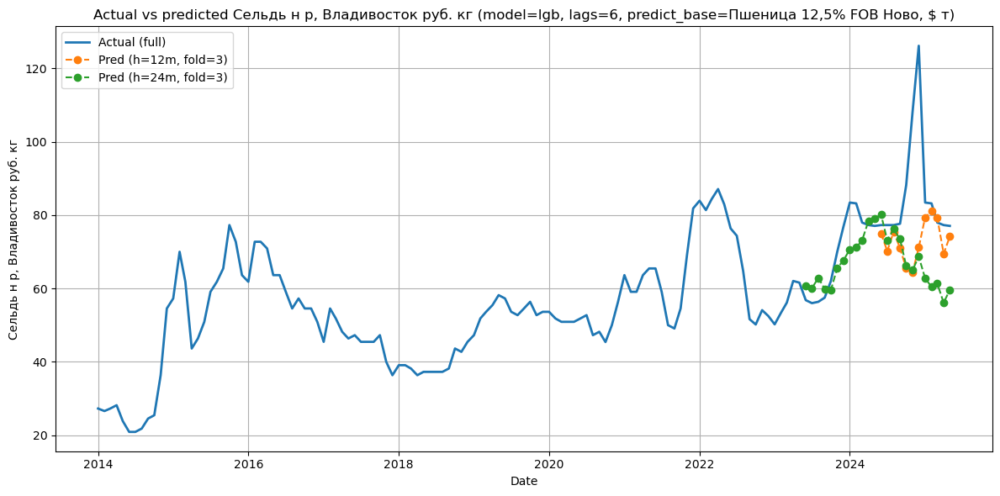

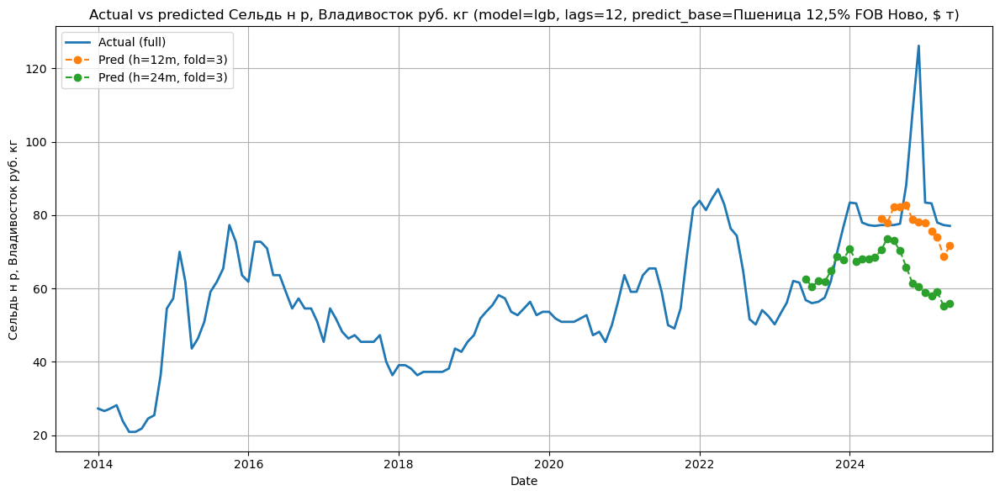

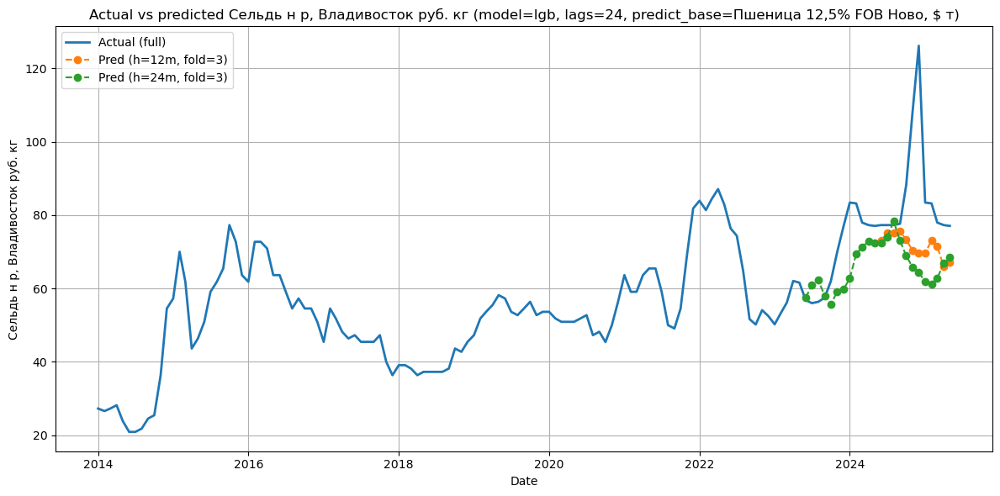

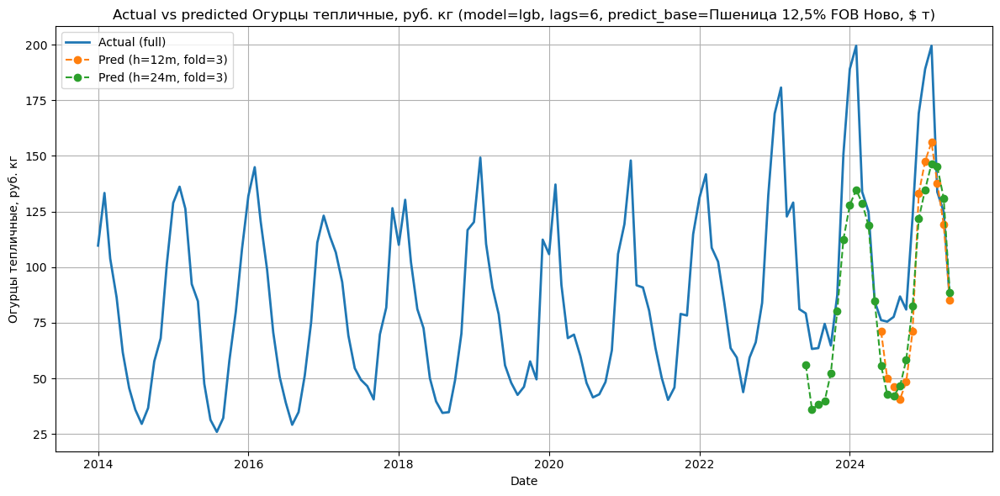

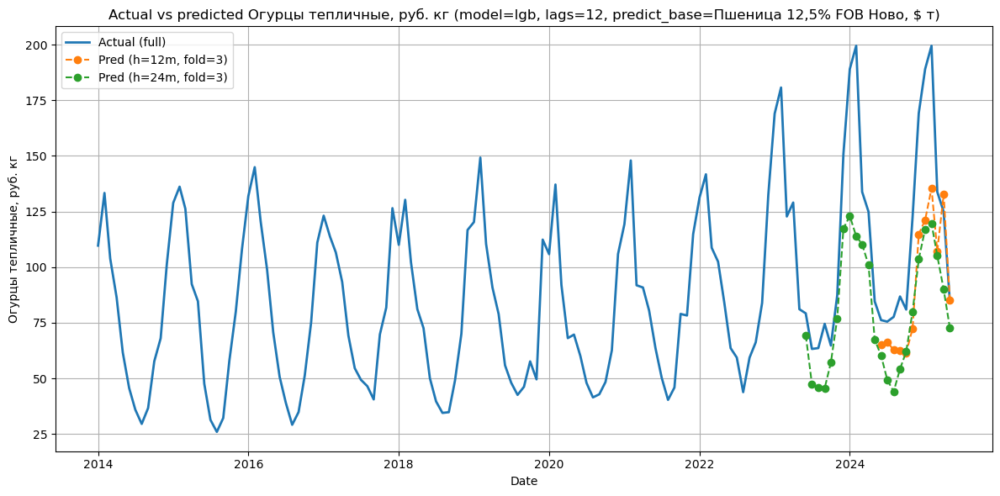

...

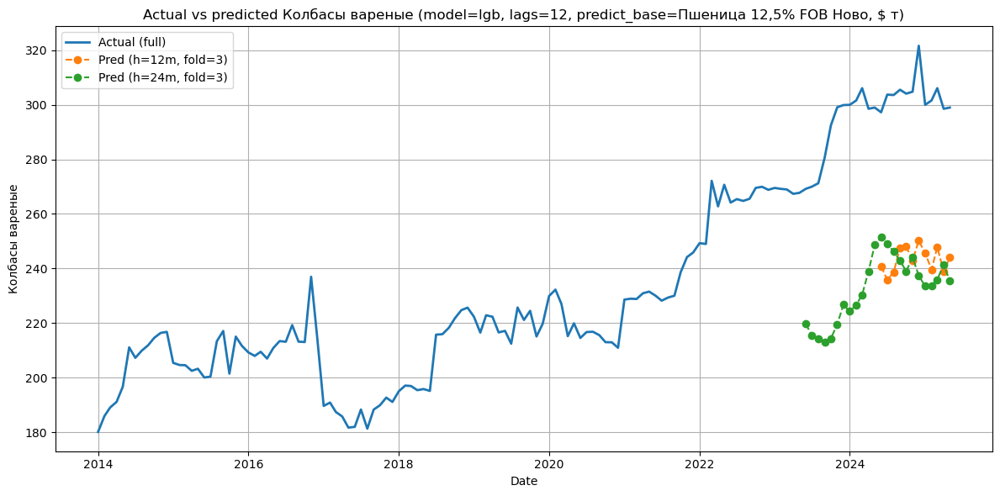

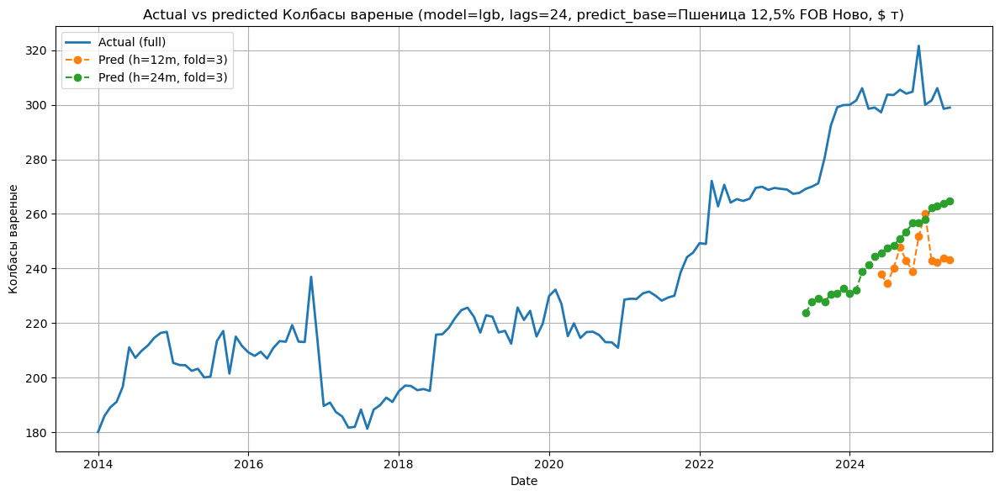

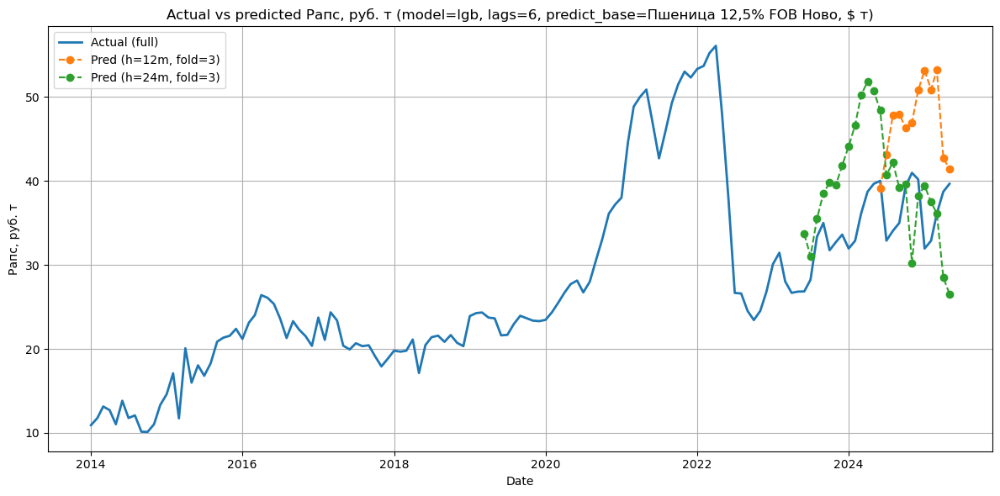

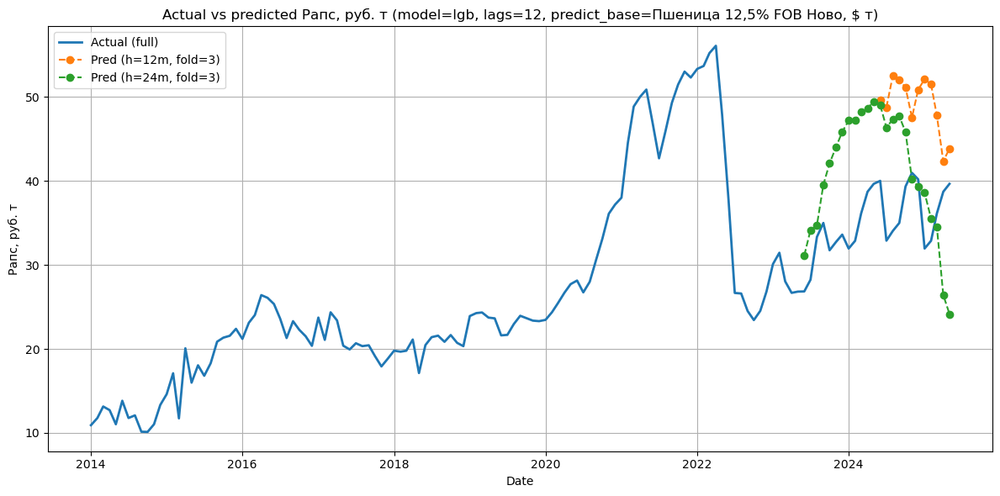

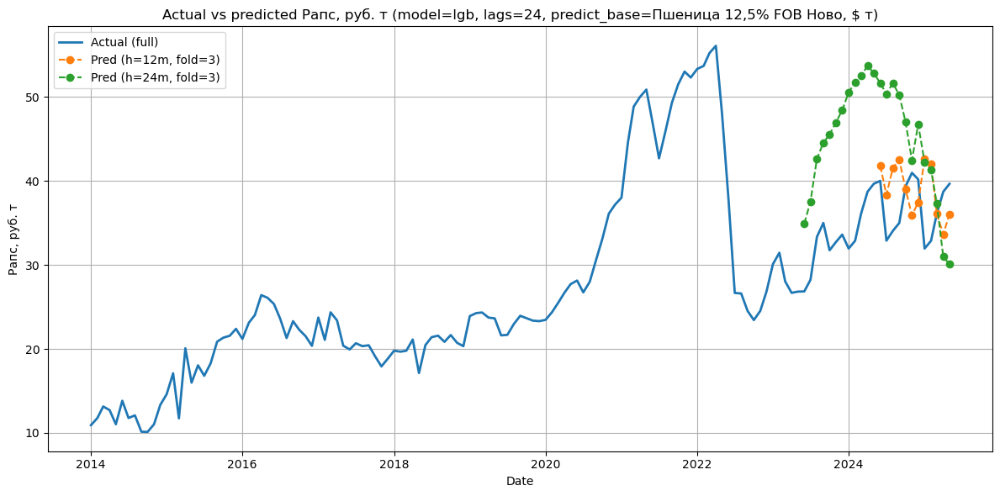

ValueError: 
Actual vs predicted Рапсовое масло EU, $ т (model=lgb, lags=6, predict_base=Пшеница 12,5% FOB Ново, $ т)
                                       ^
ParseException: Expected end of text, found '$'  (at char 39), (line:1, col:40)

<Figure size 1200x600 with 1 Axes>

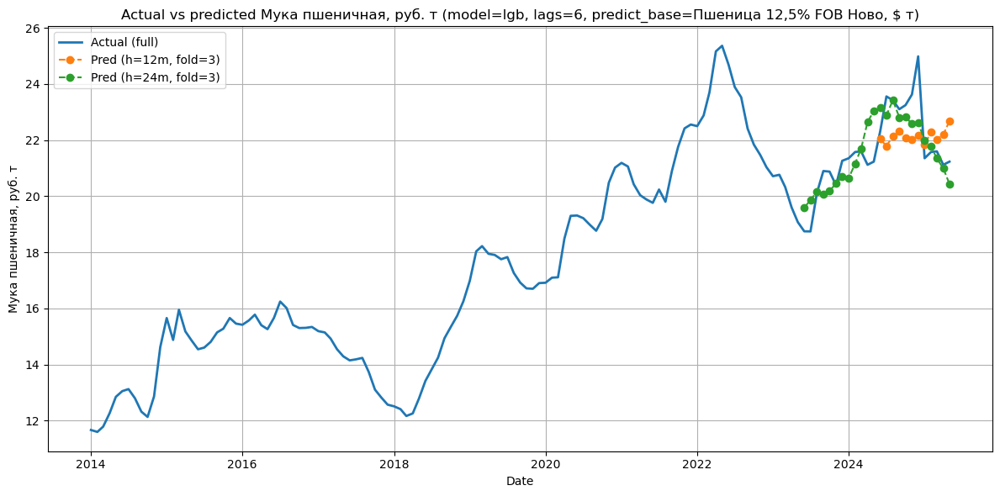

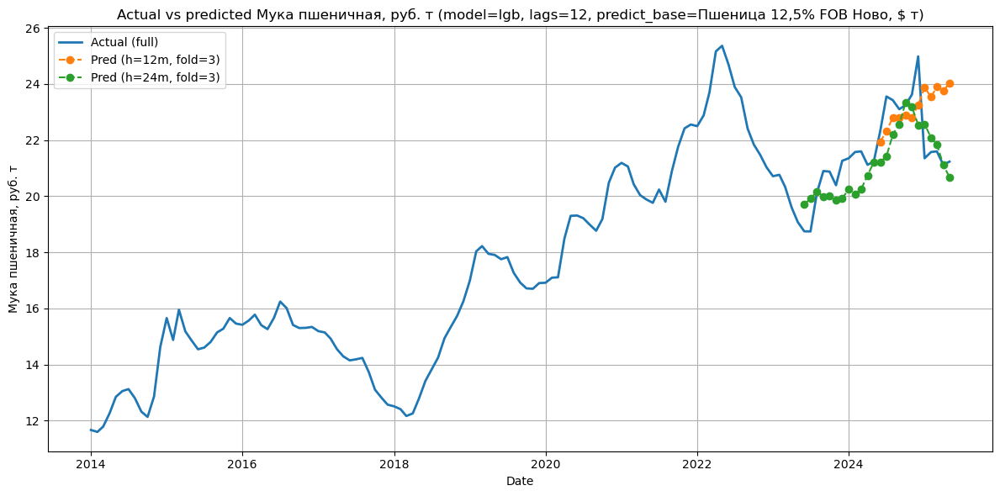

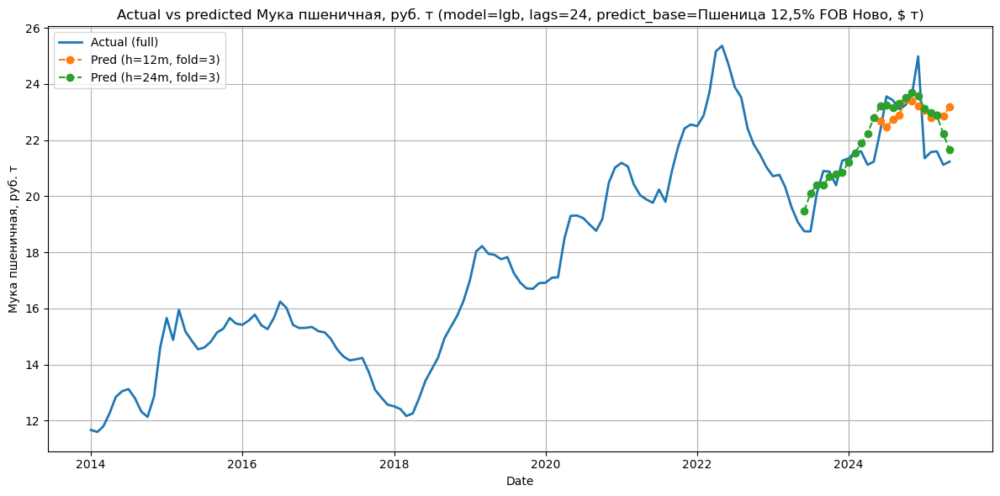

ValueError: 
Actual vs predicted Пшеница 12,5% FOB Ново, $ т (model=lgb, lags=6, predict_base=Пшеница 12,5% FOB Ново, $ т)
                                            ^
ParseException: Expected end of text, found '$'  (at char 44), (line:1, col:45)

<Figure size 1200x600 with 1 Axes>

In [17]:
import warnings
from typing import Dict, List, Optional, Tuple
from utils.utils import plot_mode_top_features_grid
from utils.boosting_utils import extract_feature_importances_lgb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from skforecast.model_selection import TimeSeriesFold
import warnings
from typing import Dict, List, Optional, Tuple
import numpy as np
import pandas as pd
from pathlib import Path
from utils.utils import build_lgb_regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
import re
from skforecast.direct import ForecasterDirectMultiVariate
# skforecast imports
from skforecast.direct import ForecasterDirectMultiVariate
from skforecast.model_selection  import (
    backtesting_forecaster_multiseries,
    grid_search_forecaster_multiseries,
    random_search_forecaster_multiseries
)
from utils.boosting_utils import map_back_feature_name, sanitize_df_columns
from forecaster.launch_experiments import start_experiments
from forecaster.evaluator import ForecasterEvaluator

# -------------------------
# Helper: build forecaster
# -------------------------

RANDOM_STATE = 52
if __name__ == "__main__":
    regressors = {
        "rf": RandomForestRegressor(n_estimators=100, random_state=RANDOM_STATE),
        # pass factory (callable) for LightGBM so it is created per horizon/lags
        "lgb": lambda horizon, lags: build_lgb_regressor(horizon=horizon, lags=lags, random_state=RANDOM_STATE)
    }
    start_experiments(apk_nona_en,
                      global_macros_en,
                      regressors,
                      ForecasterEvaluator())

---
## Plotting 

Saved heatmap to results/mape_heatmap_12_lag6_rf.png


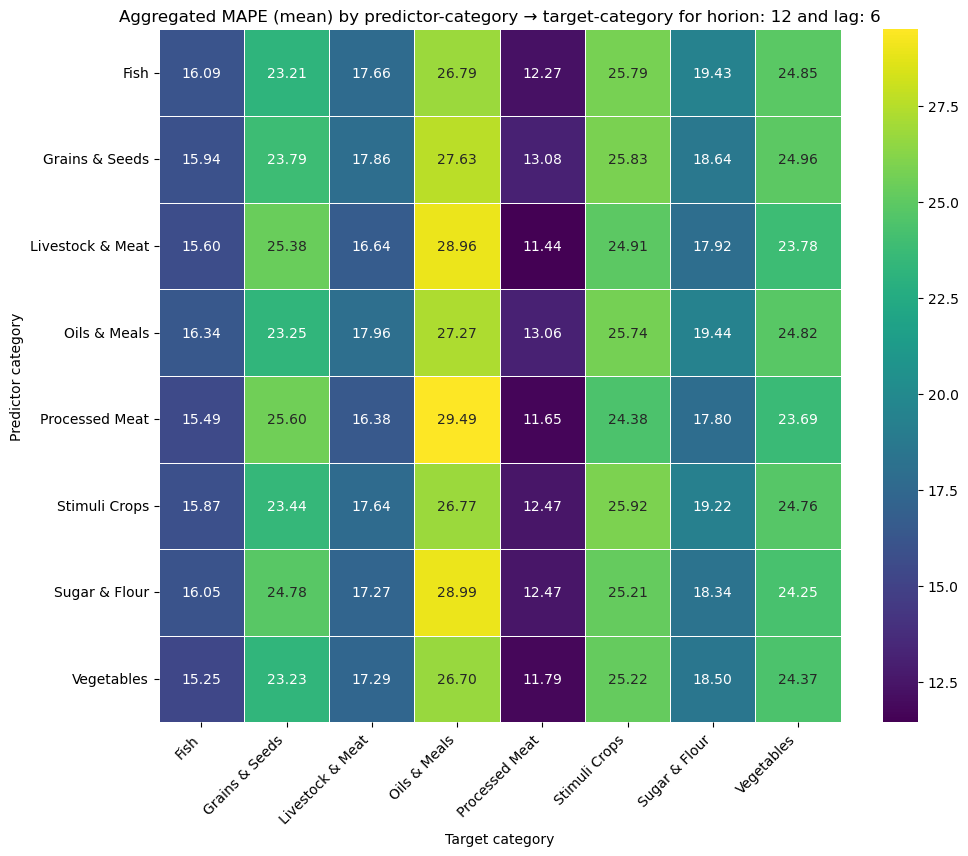

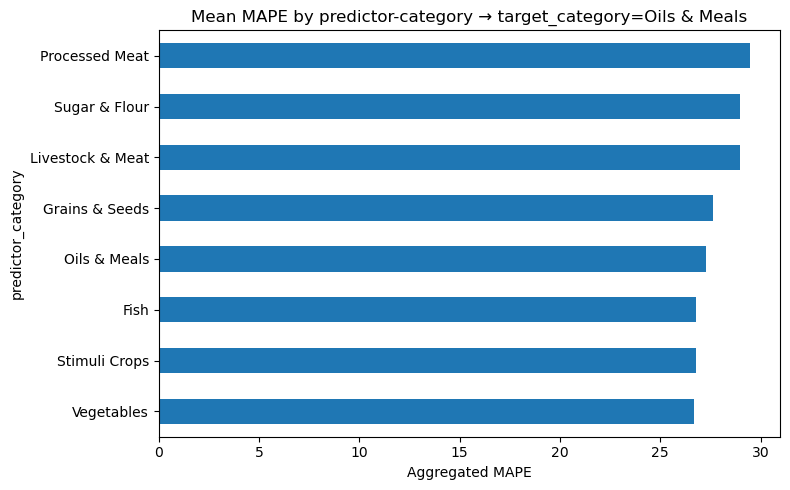

predictor_category
Vegetables          26.700121
Stimuli Crops       26.766907
Fish                26.785174
Oils & Meals        27.267856
Grains & Seeds      27.633623
Livestock & Meat    28.958344
Sugar & Flour       28.991811
Processed Meat      29.488644
Name: mape, dtype: float64
Saved heatmap to results/mape_heatmap_12_lag12_rf.png


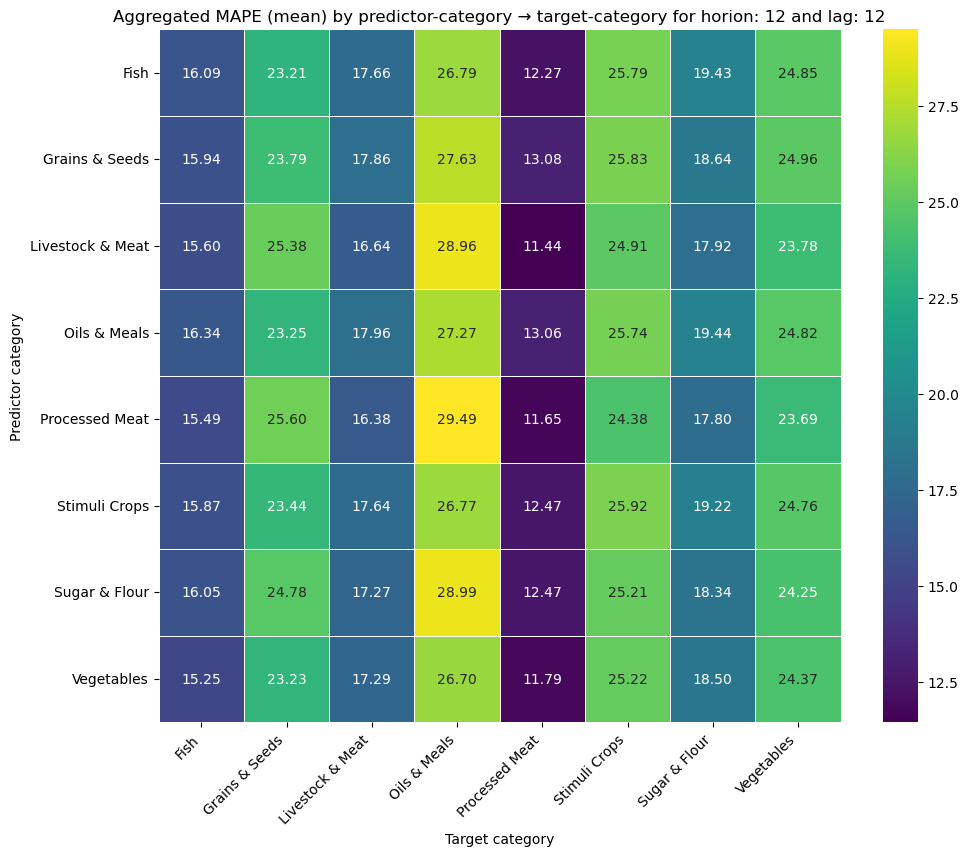

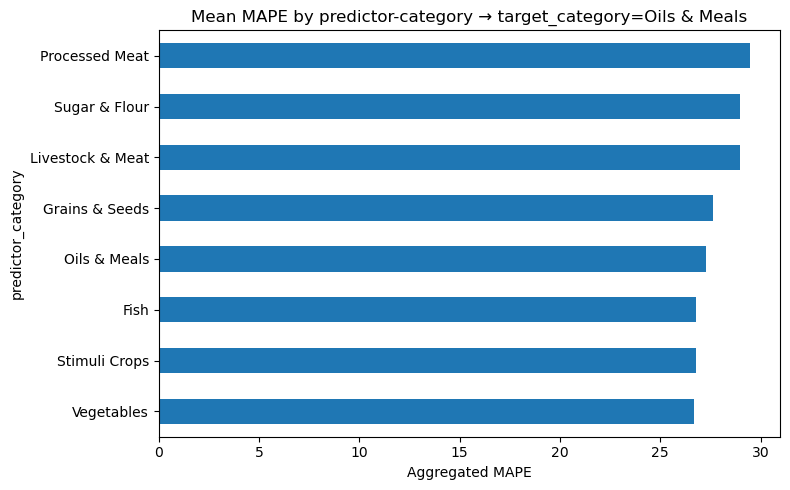

predictor_category
Vegetables          26.700121
Stimuli Crops       26.766907
Fish                26.785174
Oils & Meals        27.267856
Grains & Seeds      27.633623
Livestock & Meat    28.958344
Sugar & Flour       28.991811
Processed Meat      29.488644
Name: mape, dtype: float64
Saved heatmap to results/mape_heatmap_12_lag24_rf.png


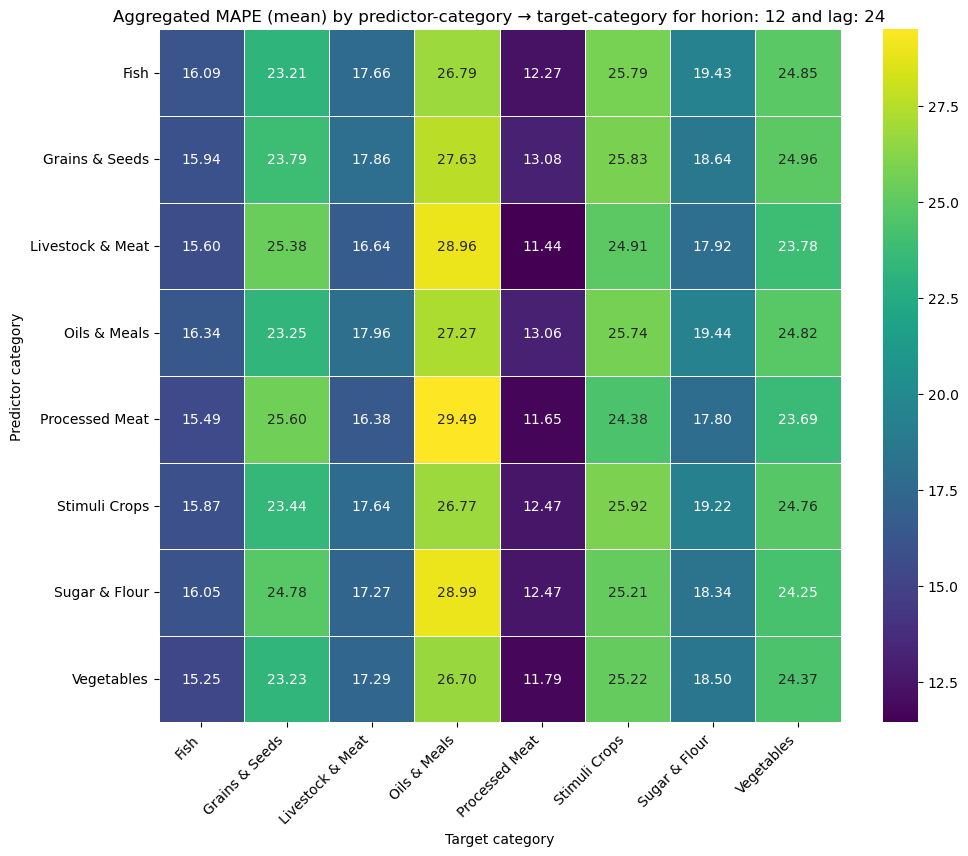

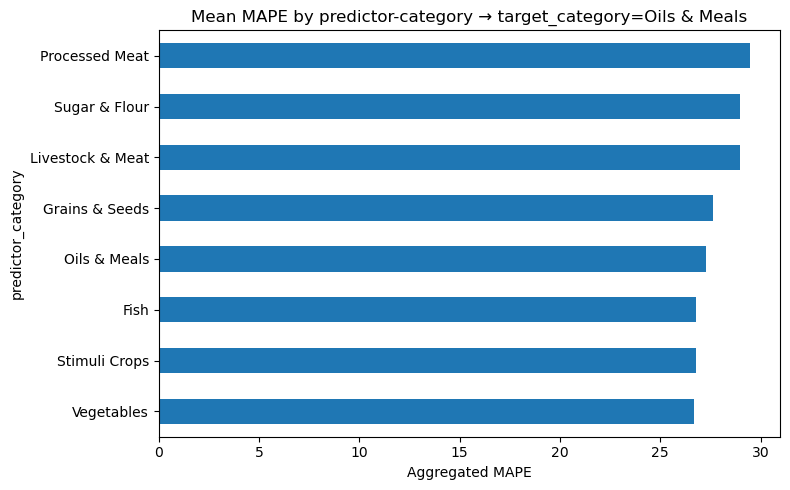

predictor_category
Vegetables          26.700121
Stimuli Crops       26.766907
Fish                26.785174
Oils & Meals        27.267856
Grains & Seeds      27.633623
Livestock & Meat    28.958344
Sugar & Flour       28.991811
Processed Meat      29.488644
Name: mape, dtype: float64
Saved heatmap to results/mape_heatmap_24_lag6_rf.png


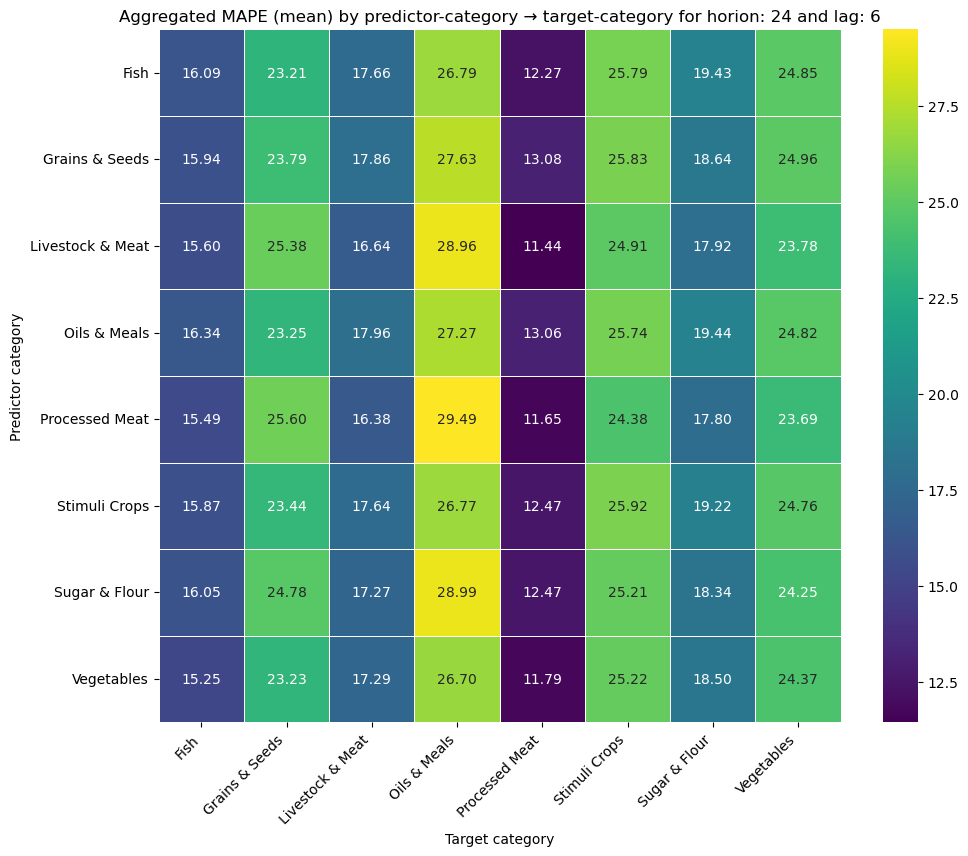

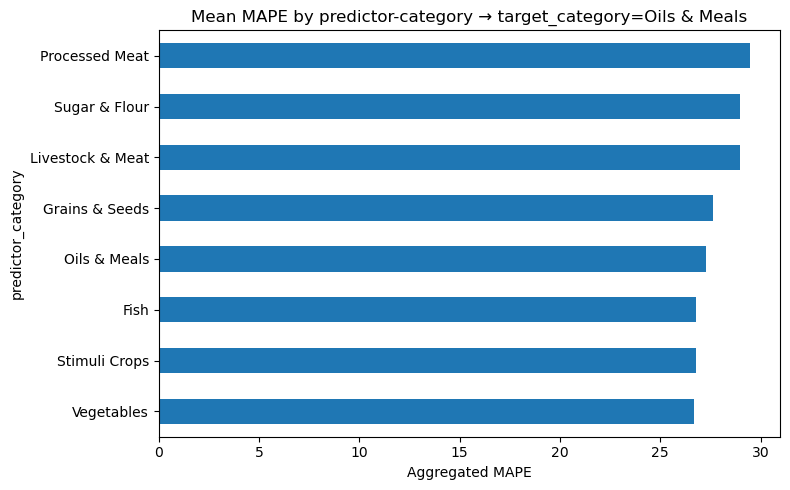

predictor_category
Vegetables          26.700121
Stimuli Crops       26.766907
Fish                26.785174
Oils & Meals        27.267856
Grains & Seeds      27.633623
Livestock & Meat    28.958344
Sugar & Flour       28.991811
Processed Meat      29.488644
Name: mape, dtype: float64
Saved heatmap to results/mape_heatmap_24_lag12_rf.png


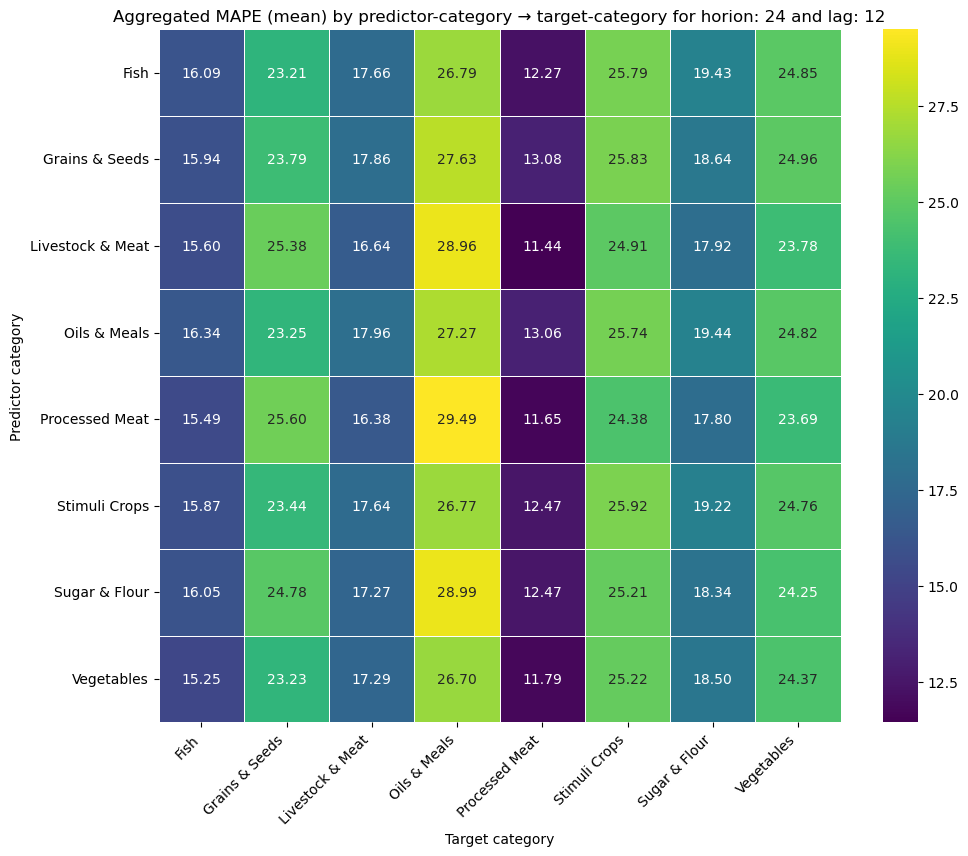

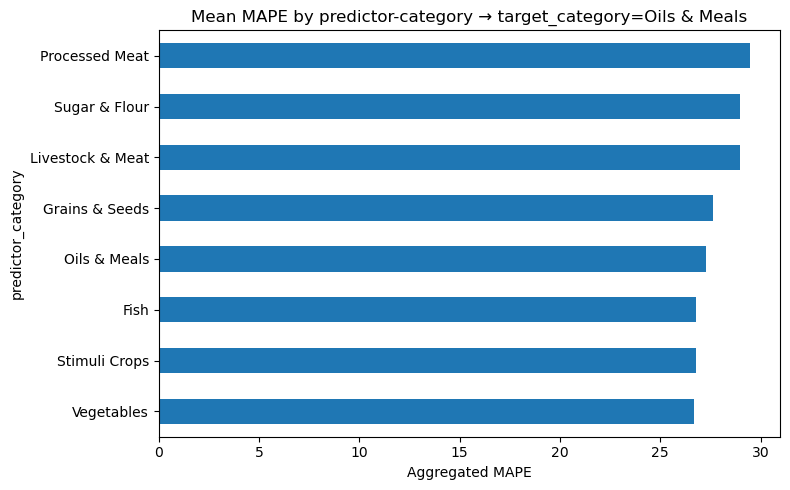

predictor_category
Vegetables          26.700121
Stimuli Crops       26.766907
Fish                26.785174
Oils & Meals        27.267856
Grains & Seeds      27.633623
Livestock & Meat    28.958344
Sugar & Flour       28.991811
Processed Meat      29.488644
Name: mape, dtype: float64
Saved heatmap to results/mape_heatmap_24_lag24_rf.png


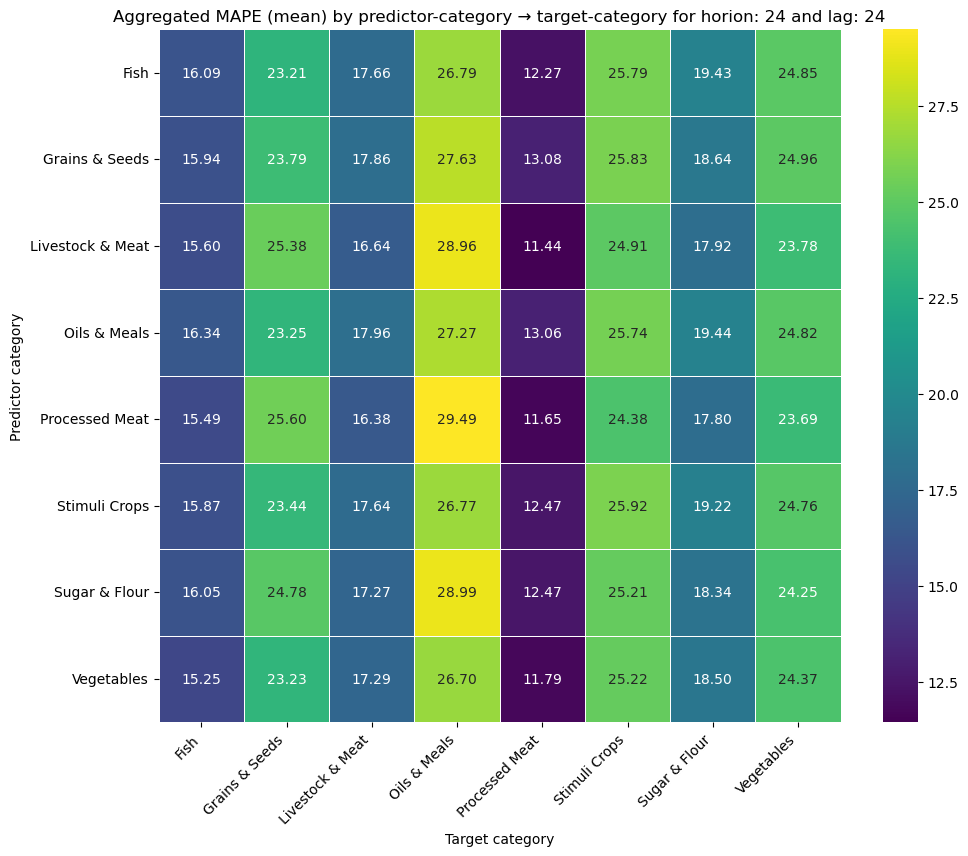

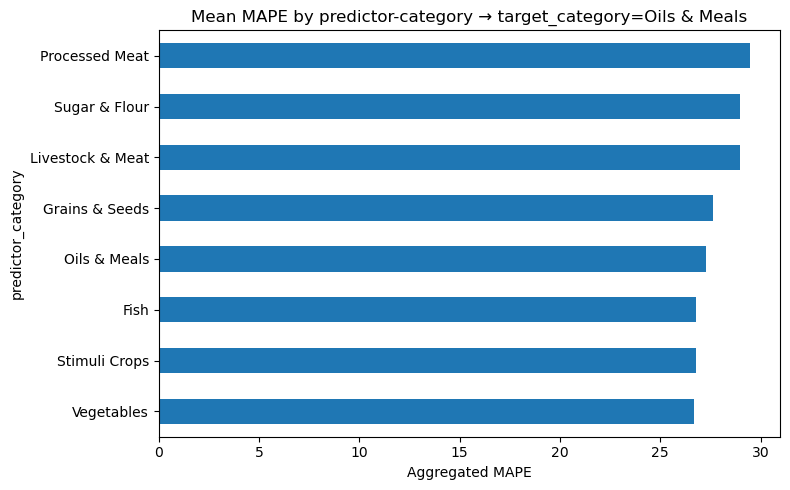

predictor_category
Vegetables          26.700121
Stimuli Crops       26.766907
Fish                26.785174
Oils & Meals        27.267856
Grains & Seeds      27.633623
Livestock & Meat    28.958344
Sugar & Flour       28.991811
Processed Meat      29.488644
Name: mape, dtype: float64


In [5]:
from utils.utils import aggregate_mape_by_category, plot_mape_bar_for_target, plot_mape_heatmap


# folded = aggregate_mape_by_category(algo_name="lgb")


for horizon in [12, 24]:
    for lag in [6, 12, 24]:
        # 2) plot heatmap of mean MAPE by predictor-category -> target-category
        folded_sub = folded[folded["horizon_months"]==horizon]
        folded_sub = folded_sub[folded_sub["lags"]==lag]
        pivot = plot_mape_heatmap(folded,
                                  agg_method='mean',
                                  horizon=horizon,
                                  lag=lag,
                                  normalize_rows=False,
                                  figsize=(11,9),
                                  save_path=f"results/mape_heatmap_{horizon}_lag{lag}_rf.png")
        
        # 3) optionally, inspect a single target-category with a bar chart
        bar_series = plot_mape_bar_for_target(folded, target_category='Oils & Meals', agg_method='mean', top_k=None)
        print(bar_series)
        # plot_category_heatmap_and_stacked(agg_sub,
        #                                   agg_method='mean',
        #                                   horizon=horizon,
        #                                   lag=lag,
        #                                   normalize_rows=False,
        #                                   save_dir=f"results/lgb_category_plots_{horizon}_{lag}", show=True)

In [2]:
folded

,predictor_series,predictor_category,target_series,target_category,model,horizon_months,lags,fold_index,cutoff,mape
0,Баранина в живом весе,Livestock & Meat,Баранина в живом весе,Livestock & Meat,lgb,12,6,1,2022-05-01,11.300846
1,Баранина в живом весе,Livestock & Meat,Баранина в живом весе,Livestock & Meat,lgb,12,6,2,2023-05-01,21.949152
2,Баранина в живом весе,Livestock & Meat,Баранина в живом весе,Livestock & Meat,lgb,12,6,3,2024-05-01,24.960852
3,Баранина в живом весе,Livestock & Meat,Баранина в живом весе,Livestock & Meat,lgb,12,12,1,2022-05-01,8.906626
4,Баранина в живом весе,Livestock & Meat,Баранина в живом весе,Livestock & Meat,lgb,12,12,2,2023-05-01,24.321283
...,...,...,...,...,...,...,...,...,...,...
28697,Яйцо товарное,Livestock & Meat,Яйцо товарное,Livestock & Meat,lgb,24,12,2,2021-05-01,29.566357
28698,Яйцо товарное,Livestock & Meat,Яйцо товарное,Livestock & Meat,lgb,24,12,3,2023-05-01,38.956360
28699,Яйцо товарное,Livestock & Meat,Яйцо товарное,Livestock & Meat,lgb,24,24,1,2019-05-01,18.768429
28700,Яйцо товарное,Livestock & Meat,Яйцо товарное,Livestock & Meat,lgb,24,24,2,2021-05-01,27.091661


In [1]:
from utils.utils import plot_mode_top_features_grid


for predict_col in apk_nona_en.drop(columns=["USDRUB", "Unnamed: 0"]).columns.tolist():
    print(f"{predict_col}")
    normed_predict_col_name = predict_col.replace("/", " ")
    
    print("="*100)
    for target_column in apk_nona_en.drop(columns=["USDRUB", "Unnamed: 0"]).columns.tolist():
        normed_target_col_name = target_column.replace("/", " ")
        if len(normed_predict_col_name) + len(normed_target_col_name) >= 120:
            normed_predict_col_name = normed_predict_col_name[:50]
            normed_target_col_name = normed_target_col_name[:50]
        if normed_predict_col_name != normed_target_col_name:
            try:
                plot_mode_top_features_grid(normed_target_col_name,
                                            normed_predict_col_name,
                                            figsize_per_ax=(12,10),
                                            show=False,
                                            save_dir=f"results/{target_column}_{normed_predict_col_name}_featureimportance_new")
            except Exception as e:
                print(e)


KeyboardInterrupt



[WARN] missing file for Баранина в убойном весе  -> Баранина в живом весе: There is no feature importance for Баранина в живом весе_Баранина в убойном весе _tables
[WARN] missing file for Бутилированное подсолнечное масло (рафинированное) -> Баранина в живом весе: There is no feature importance for Баранина в живом весе_Бутилированное подсолнечное масло (рафинированное)_tables
[WARN] missing file for Какао-бобы -> Баранина в живом весе: There is no feature importance for Баранина в живом весе_Какао-бобы_tables
[WARN] missing file for Какао-бобы (USD) -> Баранина в живом весе: There is no feature importance for Баранина в живом весе_Какао-бобы (USD)_tables
[WARN] missing file for Кокосовое масло  -> Баранина в живом весе: There is no feature importance for Баранина в живом весе_Кокосовое масло _tables
[WARN] missing file for Кокосовое масло (USD)  -> Баранина в живом весе: There is no feature importance for Баранина в живом весе_Кокосовое масло (USD) _tables
[WARN] missing file for Колб

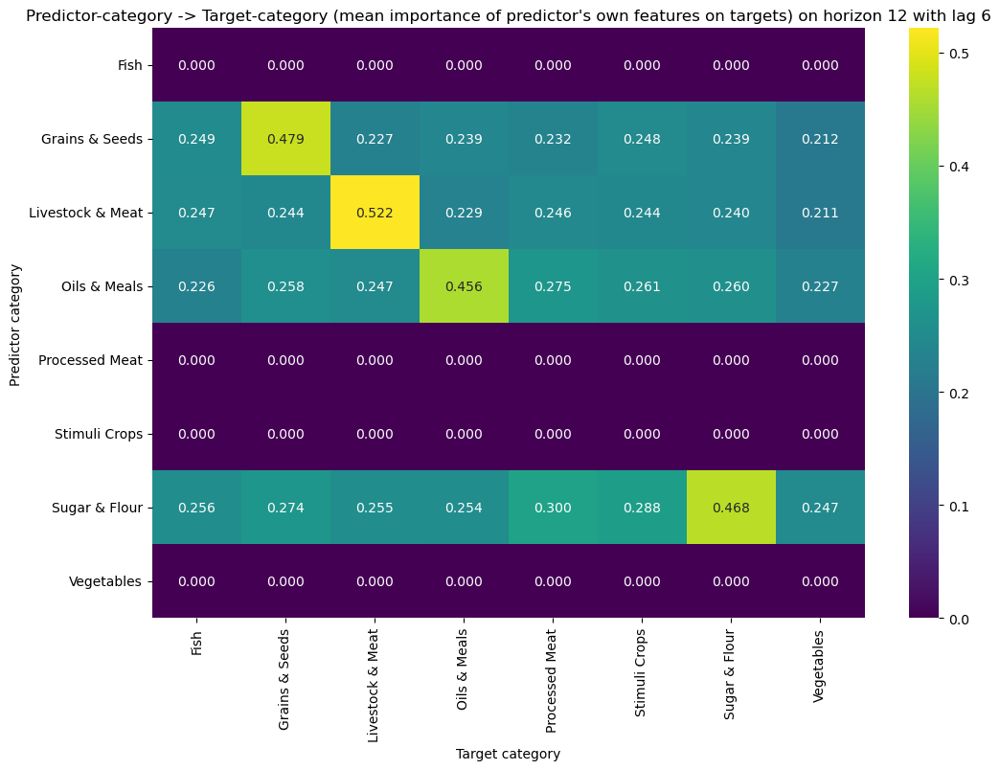

Saved stacked bar to results/category_plots_12_6\category_stacked_by_target.png


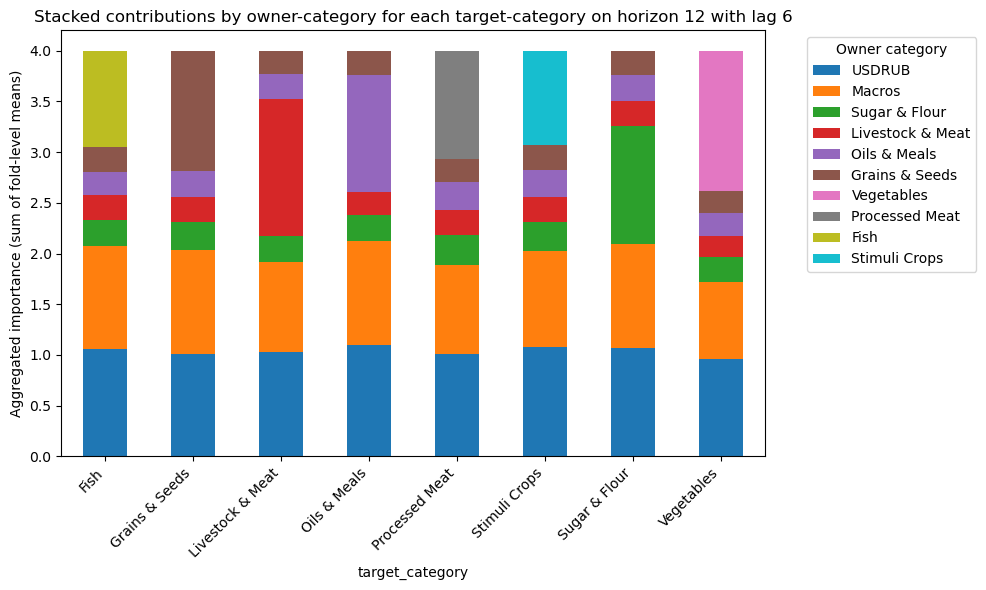

Saved heatmap to results/category_plots_12_12\category_pair_heatmap.png


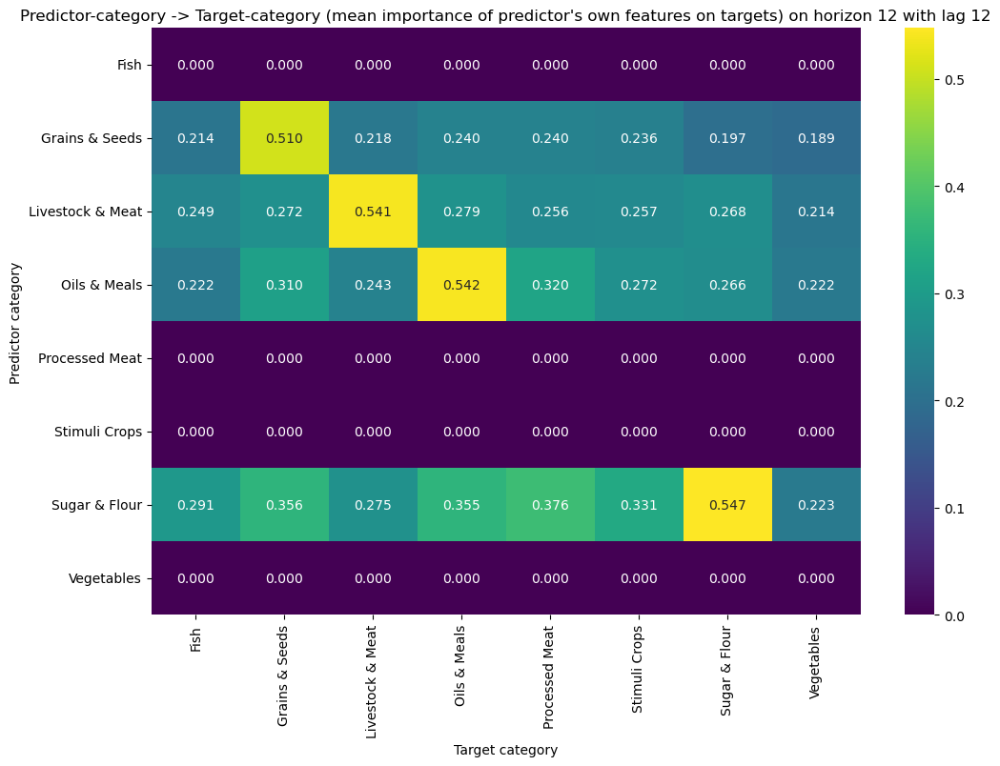

Saved stacked bar to results/category_plots_12_12\category_stacked_by_target.png


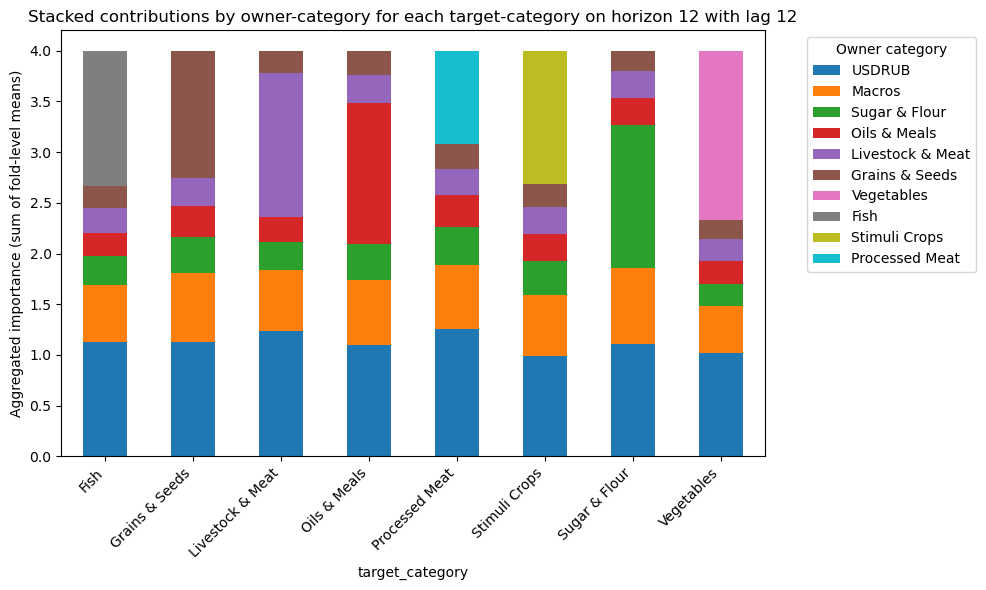

Saved heatmap to results/category_plots_12_24\category_pair_heatmap.png


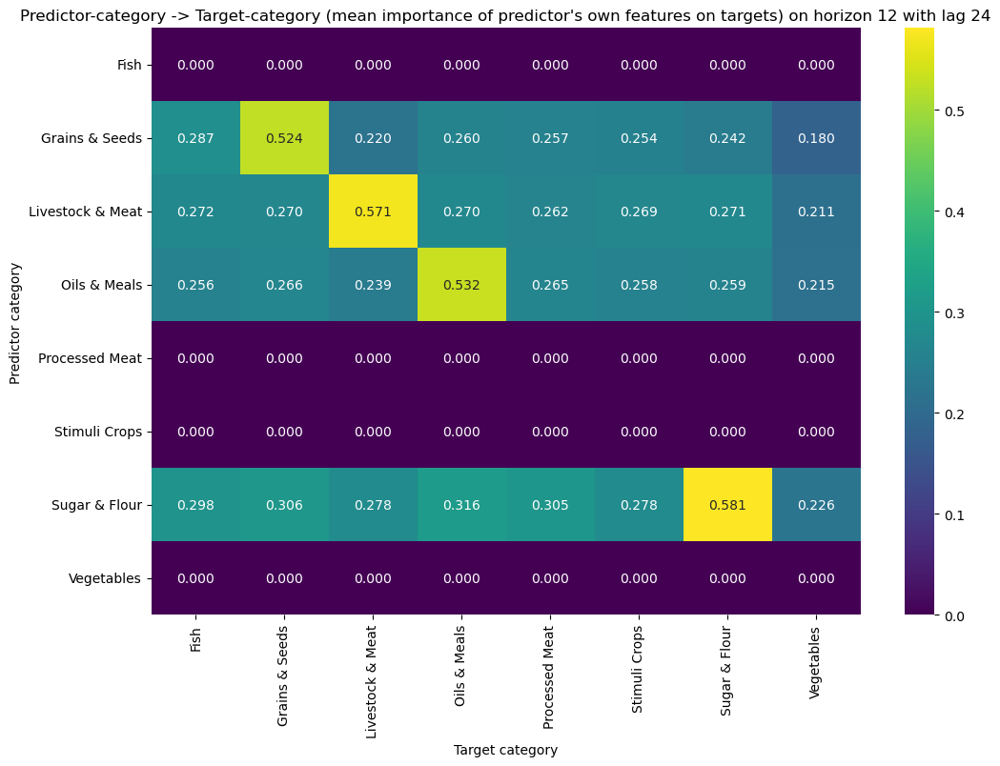

Saved stacked bar to results/category_plots_12_24\category_stacked_by_target.png


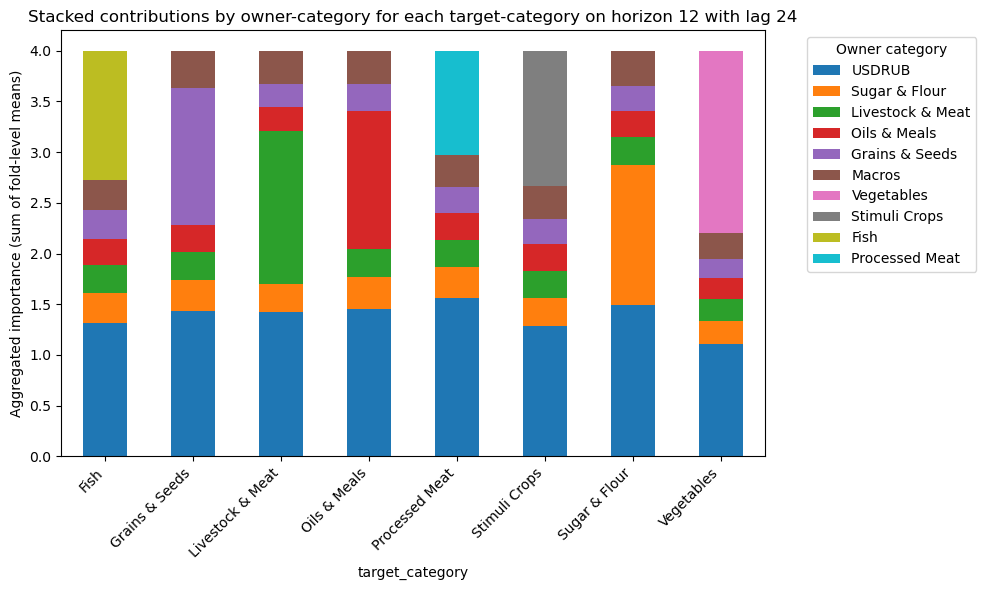

Saved heatmap to results/category_plots_24_6\category_pair_heatmap.png


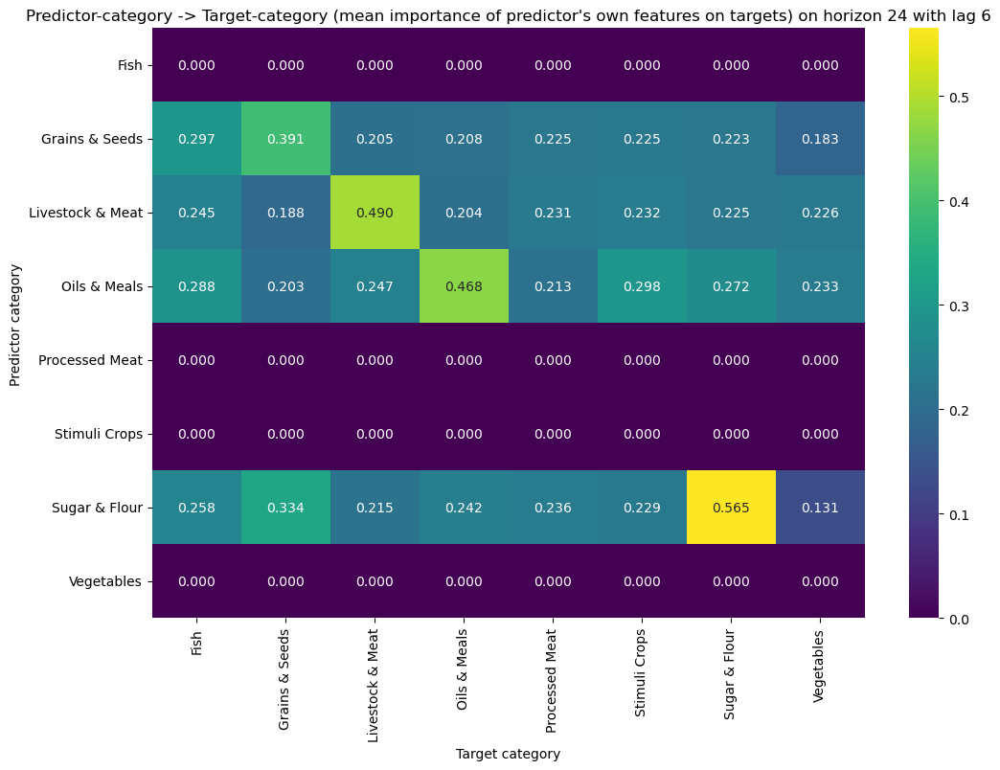

Saved stacked bar to results/category_plots_24_6\category_stacked_by_target.png


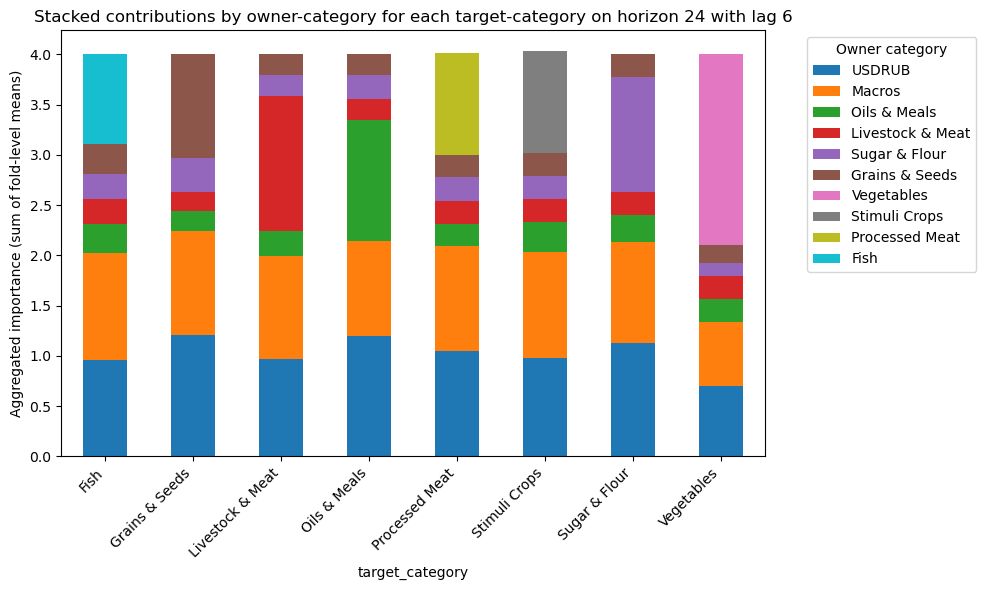

Saved heatmap to results/category_plots_24_12\category_pair_heatmap.png


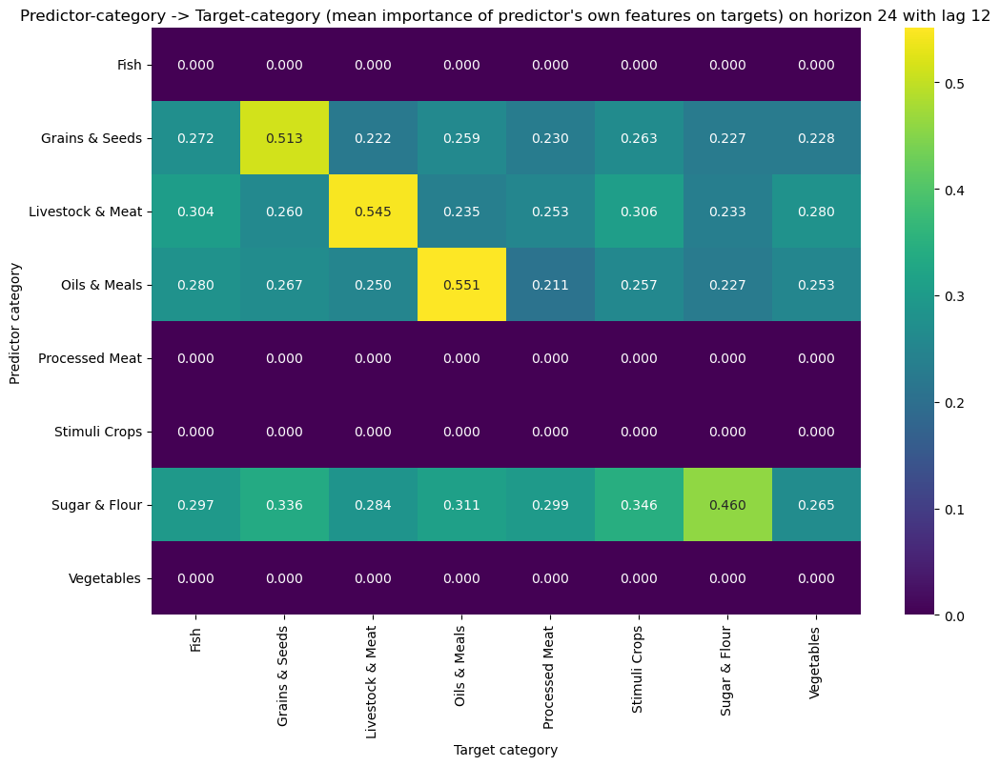

Saved stacked bar to results/category_plots_24_12\category_stacked_by_target.png


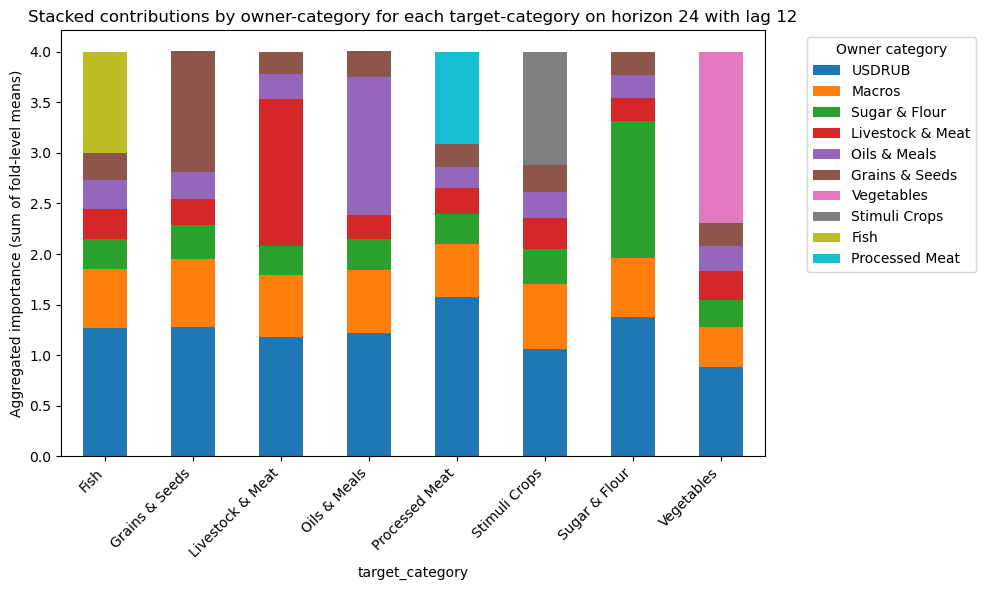

Saved heatmap to results/category_plots_24_24\category_pair_heatmap.png


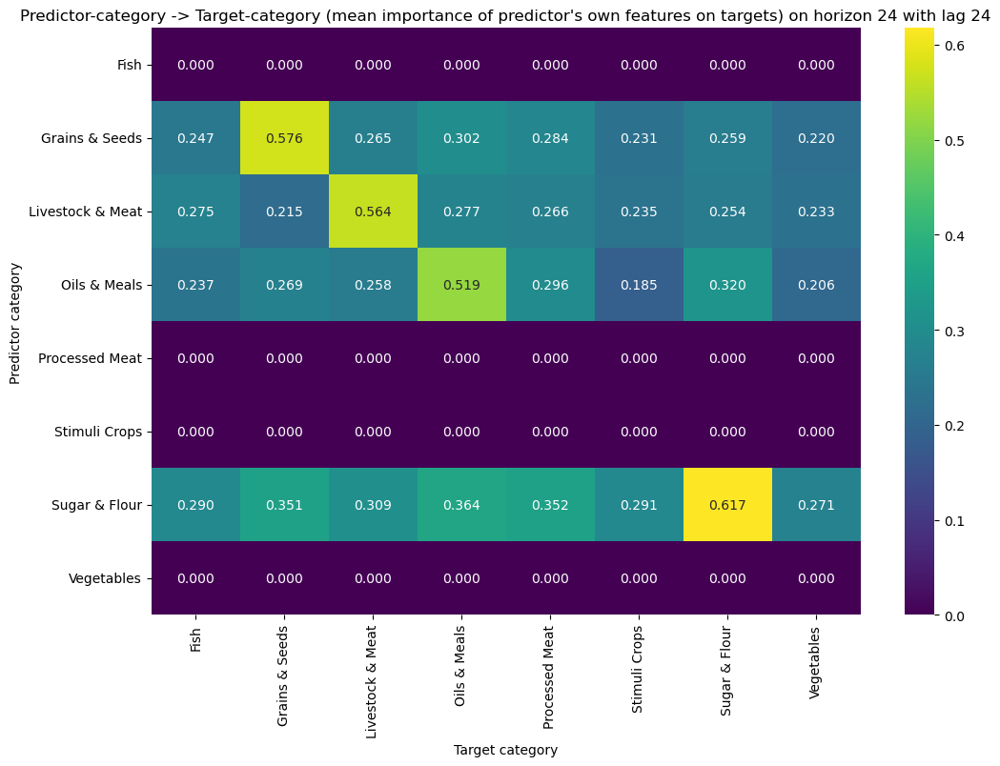

Saved stacked bar to results/category_plots_24_24\category_stacked_by_target.png


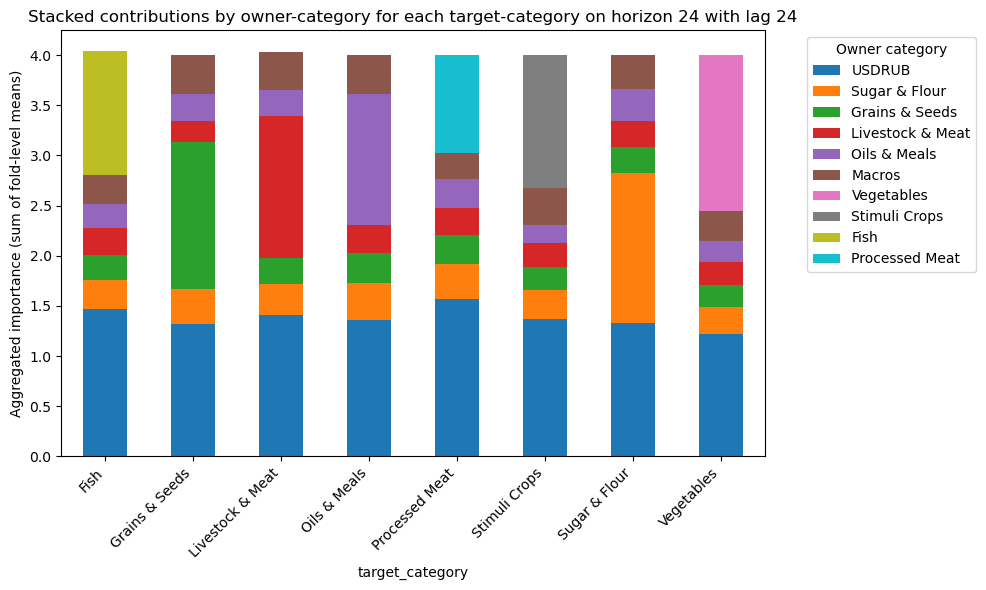

ValueError: aggregated_df is empty

In [1]:
from utils.utils import aggregate_feature_importances_by_category, plot_category_heatmap_and_stacked


agg = aggregate_feature_importances_by_category(algo_name="lgb")

for horizon in [12, 24, 36]:
    for lag in [6, 12, 24]:
        agg_sub = agg[agg["horizon"]==horizon]
        agg_sub = agg_sub[agg_sub["lags"]==lag]
        plot_category_heatmap_and_stacked(agg_sub,
                                          agg_method='mean',
                                          horizon=horizon,
                                          lag=lag,
                                          normalize_rows=False,
                                          save_dir=f"results/category_plots_{horizon}_{lag}", show=True)

In [2]:
agg

,predictor_series,target_series,model_family,horizon,lags,fold_index,owner_category,importance_sum,predictor_category,target_category
0,Баранина в убойном весе,Баранина в живом весе,rf,12,6,1,Livestock & Meat,0.652885,Livestock & Meat,Livestock & Meat
1,Баранина в убойном весе,Баранина в живом весе,rf,12,6,1,Macros,0.150741,Livestock & Meat,Livestock & Meat
2,Баранина в убойном весе,Баранина в живом весе,rf,12,6,1,USDRUB,0.196374,Livestock & Meat,Livestock & Meat
3,Баранина в убойном весе,Баранина в живом весе,rf,12,6,2,Livestock & Meat,0.632253,Livestock & Meat,Livestock & Meat
4,Баранина в убойном весе,Баранина в живом весе,rf,12,6,2,Macros,0.113993,Livestock & Meat,Livestock & Meat
...,...,...,...,...,...,...,...,...,...,...
143611,"Томаты тепличные, руб. кг",Яйцо товарное,rf,36,24,2,Vegetables,0.316491,Vegetables,Livestock & Meat
143612,"Томаты тепличные, руб. кг",Яйцо товарное,rf,36,24,3,Livestock & Meat,0.210272,Vegetables,Livestock & Meat
143613,"Томаты тепличные, руб. кг",Яйцо товарное,rf,36,24,3,Macros,0.397680,Vegetables,Livestock & Meat
143614,"Томаты тепличные, руб. кг",Яйцо товарное,rf,36,24,3,USDRUB,0.184078,Vegetables,Livestock & Meat


In [6]:
agg[agg["predictor_category"] == "Other"]

,predictor_series,target_series,model_family,horizon,lags,fold_index,owner_category,importance_sum,predictor_category,target_category
37536,Подсолнечное масло (наливом) не бутилированное...,"Минтай б г, Владивосток руб. кг",rf,12,6,1,Fish,0.249242,Other,Fish
37537,Подсолнечное масло (наливом) не бутилированное...,"Минтай б г, Владивосток руб. кг",rf,12,6,1,Macros,0.228837,Other,Fish
37538,Подсолнечное масло (наливом) не бутилированное...,"Минтай б г, Владивосток руб. кг",rf,12,6,1,USDRUB,0.521921,Other,Fish
37539,Подсолнечное масло (наливом) не бутилированное...,"Минтай б г, Владивосток руб. кг",rf,12,6,2,Fish,0.278244,Other,Fish
37540,Подсолнечное масло (наливом) не бутилированное...,"Минтай б г, Владивосток руб. кг",rf,12,6,2,Macros,0.354813,Other,Fish
...,...,...,...,...,...,...,...,...,...,...
136627,Подсолнечное масло (наливом) не бутилированное...,"Томаты тепличные, руб. кг",rf,36,24,2,USDRUB,0.645726,Other,Vegetables
136628,Подсолнечное масло (наливом) не бутилированное...,"Томаты тепличные, руб. кг",rf,36,24,2,Vegetables,0.299569,Other,Vegetables
136629,Подсолнечное масло (наливом) не бутилированное...,"Томаты тепличные, руб. кг",rf,36,24,3,Macros,0.015575,Other,Vegetables
136630,Подсолнечное масло (наливом) не бутилированное...,"Томаты тепличные, руб. кг",rf,36,24,3,USDRUB,0.054664,Other,Vegetables
